In [586]:
import warnings

warnings.simplefilter("ignore", UserWarning)
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", DeprecationWarning)

In [587]:
!pip install icecream
!pip install graphviz
! pip install rich
! pip install plantuml
! pip install spacy

#core random feature
import time
import random
from random import choice

# pretty python
from rich.table import Table
from rich.console import Console
console = Console()


#graphing libs

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [588]:
import os
import pandas as pd
import io
from google.colab import files
 
 
uploaded = files.upload()

Saving Product_details - Copy.csv to Product_details - Copy (3).csv


In [589]:
 #Import Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import string
import spacy

from matplotlib.pyplot import imread
from wordcloud import WordCloud, STOPWORDS
%matplotlib inline

In [590]:
import pandas as pd
import io
 
df = pd.read_csv(io.BytesIO(uploaded[r'Product_details - Copy.csv']))
print(df)

      Text_ID                                Product_Description  \
0        3057  The Web DesignerÛªs Guide to iOS (and Android...   
1        6254  RT @mention Line for iPad 2 is longer today th...   
2        8212  Crazy that Apple is opening a temporary store ...   
3        4422  The lesson from Google One Pass: In this digit...   
4        5526  RT @mention At the panel: &quot;Your mom has a...   
...       ...                                                ...   
6359     2945  Thanks @mention for hosting this event #sxsw #...   
6360     4528  SXSW iPhone app is awesome, but iPad app crash...   
6361     6526  RT @mention RT @mention Download 20+ free trac...   
6362     2110  OH at Texas Social Media Awards: 'You don't ne...   
6363     2177  #Google launching a &quot;major&quot; new soci...   

      Product_Type  Sentiment  
0                9          2  
1                9          2  
2                9          2  
3                9          2  
4                9     

In [591]:
df

,Text_ID,Product_Description,Product_Type,Sentiment
0,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2
1,6254,RT @mention Line for iPad 2 is longer today th...,9,2
2,8212,Crazy that Apple is opening a temporary store ...,9,2
3,4422,The lesson from Google One Pass: In this digit...,9,2
4,5526,RT @mention At the panel: &quot;Your mom has a...,9,2
...,...,...,...,...
6359,2945,Thanks @mention for hosting this event #sxsw #...,9,2
6360,4528,"SXSW iPhone app is awesome, but iPad app crash...",7,1
6361,6526,RT @mention RT @mention Download 20+ free trac...,9,2
6362,2110,OH at Texas Social Media Awards: 'You don't ne...,9,2


In [592]:
df.corr()

,Text_ID,Product_Type,Sentiment
Text_ID,1.000000,0.033520,-0.004539
Product_Type,0.033520,1.000000,-0.440887
Sentiment,-0.004539,-0.440887,1.000000


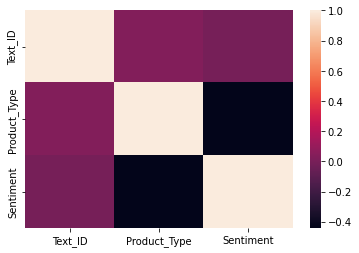

In [593]:
import seaborn as sns
sns.heatmap(df.corr())

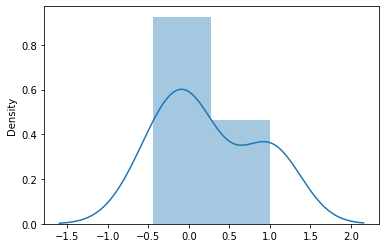

In [594]:
sns.distplot(df.corr())

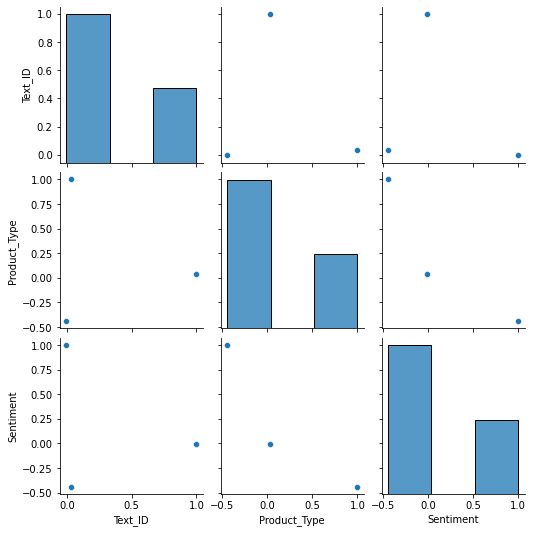

In [595]:
sns.pairplot(df.corr())

In [596]:
df.describe()

,Text_ID,Product_Type,Sentiment
count,6364.000000,6364.000000,6364.000000
mean,4568.862822,7.462445,2.230673
std,2621.198346,2.440492,0.638413
min,1.000000,0.000000,0.000000
25%,2297.750000,6.000000,2.000000
50%,4587.500000,9.000000,2.000000
75%,6827.500000,9.000000,3.000000
max,9092.000000,9.000000,3.000000


In [597]:
df.mean()

Text_ID         4568.862822
Product_Type       7.462445
Sentiment          2.230673
dtype: float64

In [598]:
df.std()

Text_ID         2621.198346
Product_Type       2.440492
Sentiment          0.638413
dtype: float64

In [599]:
df.var()

Text_ID         6.870681e+06
Product_Type    5.955999e+00
Sentiment       4.075708e-01
dtype: float64

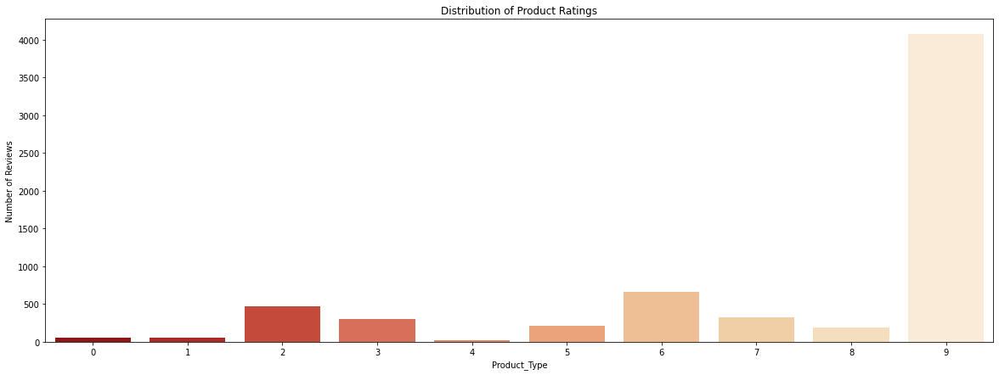

In [600]:
import seaborn as sns

f, axes = plt.subplots(figsize=(20,7))
ax = sns.countplot(x=df["Product_Type"], palette="OrRd_r")
ax.set(title="Distribution of Product Ratings", \
       xlabel="Product_Type", ylabel="Number of Reviews")
plt.show()

In [601]:
pd.crosstab(df.Sentiment, df.Product_Type)

Product_Type,0,1,2,3,4,5,6,7,8,9
Sentiment,,,,,,,,,,
0,0,0,2,1,0,0,2,0,1,105
1,4,5,69,49,0,36,84,43,65,44
2,1,1,15,10,0,6,16,8,6,3702
3,47,53,379,240,19,171,563,276,122,219


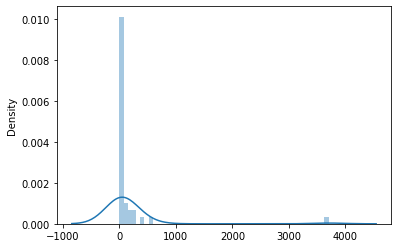

In [602]:
import seaborn as sns
import matplotlib.pyplot as plt
d=pd.crosstab(df.Sentiment, df.Product_Type)
sns.distplot(d)

DEPLOY 10

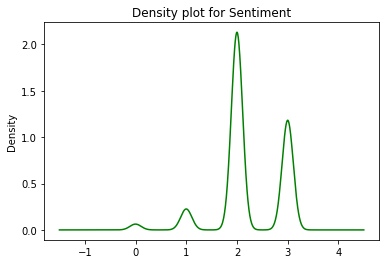

In [603]:
# plotting the density plot 
# for 'speeding' attribute
# using plot.density()
df.Sentiment.plot.density(color='green')
plt.title('Density plot for Sentiment')
plt.show()

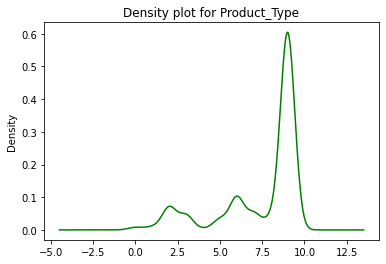

In [604]:
# plotting the density plot 
# for 'speeding' attribute
# using plot.density()
df.Product_Type.plot.density(color='green')
plt.title('Density plot for Product_Type')
plt.show()

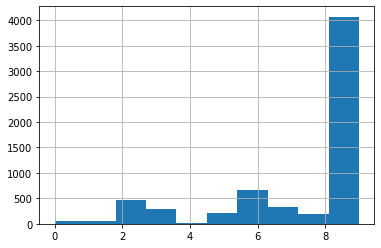

In [605]:

df['Product_Type'].hist()

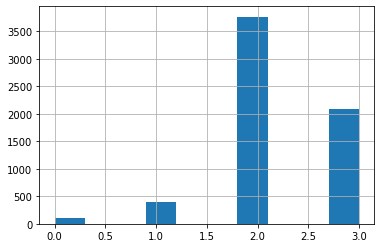

In [606]:

df['Sentiment'].hist()

In [607]:

df['Sentiment'].value_counts()

2    3765
3    2089
1     399
0     111
Name: Sentiment, dtype: int64

In [608]:
df['Product_Type'].value_counts()

9    4070
6     665
2     465
7     327
3     300
5     213
8     194
1      59
0      52
4      19
Name: Product_Type, dtype: int64

In [609]:
gk = df.groupby('Product_Type')
  
# Let's print the first entries
# in all the groups formed.
gk.first()

,Text_ID,Product_Description,Sentiment
Product_Type,,,
0,2851,#SXSW I need the best android dev here. Html5...,3
1,5773,RT @mention Get it while it's hot! The latest ...,3
2,7667,Horrible repressed memories of the Apple spinn...,1
3,1338,Ouch! Who won Google v Bing? @mention with all...,3
4,3274,Just got given a free portable iPhone charger....,3
5,6604,RT @mention RT @mention RT @mention Google to ...,3
6,6064,RT @mention I think my effing hubby is in line...,1
7,1618,Yeay! RT @mention New #UberSocial for #iPhone ...,3
8,2341,#sxsw #enchantment: @mention &quot;Sell your d...,1


In [610]:
gk.get_group(0)

,Text_ID,Product_Description,Product_Type,Sentiment
49,2851,#SXSW I need the best android dev here. Html5...,0,3
176,8513,Grab @mention for #betainvites #sxsw! @mention...,0,3
220,177,This is a #WINNING picture #android #google #s...,0,3
236,641,I knew if I plied @mention with beer and stogi...,0,3
337,6437,RT @mention Partying with #Android and @mentio...,0,3
586,6945,RT @mention Win a #sony Xperia Play #android p...,0,3
681,5354,RT @mention 40 minutes til the @mention #SXSW ...,0,3
795,3213,I'm giving $100 to the next person who comes u...,0,3
1238,5605,RT @mention Check out Lightbox.com at the Team...,0,3
1659,1005,I need to play this game on my #android - #SXS...,0,3


In [611]:
gk.get_group(0)['Sentiment'].value_counts()

3    47
1     4
2     1
Name: Sentiment, dtype: int64

DEPLOY 11

In [612]:
#producttype 0 has good reviews and has 9% negative reviews

In [613]:
gk.get_group(1)

,Text_ID,Product_Description,Product_Type,Sentiment
289,5773,RT @mention Get it while it's hot! The latest ...,1,3
461,3723,#sxsw adding my schedule into the android sxsw...,1,3
629,3459,Have you heard about the #android app Bizzy? T...,1,3
716,8963,Group #Texting War Heats Up: Fast Society Laun...,1,3
769,1535,@mention {link} you get the #sxsw app yet? And...,1,3
817,3668,Juts in time for #SXSW =&gt; Group-Texting War...,1,3
1048,3500,"95% of iPhone and Droid apps have less than 1,...",1,1
1142,3804,Domo for iOS and Android just got released! @m...,1,3
1316,2131,@mention at #SXSW! Be the first to send us a p...,1,3
1471,11,Find &amp; Start Impromptu Parties at #SXSW Wi...,1,3


In [614]:
gk.get_group(1)['Sentiment'].value_counts()

3    53
1     5
2     1
Name: Sentiment, dtype: int64

In [615]:
#producttype 1 has good reviews and 10% negative reviews 
#Create a function to calculate all product positive and negative reviews percentage Like the above

In [616]:
gk.get_group(2)

,Text_ID,Product_Description,Product_Type,Sentiment
15,7667,Horrible repressed memories of the Apple spinn...,2,1
18,6409,"RT @mention On its second day in business, the...",2,3
24,7675,adaptive retail -- apple to open pop-up shop a...,2,3
56,4344,@mention Might need to go to Apple today. I th...,2,1
66,7417,Pop-up Apple Store seems to be out of pop-up i...,2,1
...,...,...,...,...
6285,7501,At the popup apple store at #sxsw. Line is all...,2,2
6294,467,"Before it even begins, Apple wins #SXSW {link}",2,3
6307,2252,Apple grabbed the tablet mindshare at #sxsw bu...,2,3
6315,3815,"Git yer #iPad 2 here! Before It Even Begins, A...",2,3


In [617]:
gk.get_group(2)['Sentiment'].value_counts()

3    379
1     69
2     15
0      2
Name: Sentiment, dtype: int64

In [618]:
gk.get_group(3)

,Text_ID,Product_Description,Product_Type,Sentiment
29,1338,Ouch! Who won Google v Bing? @mention with all...,3,3
34,5023,#sxsw Recommendation Engine Session was fanta...,3,3
53,6483,RT @mention RT @mention @mention to Launch Ma...,3,1
73,7798,Google party. Photo booth fun. #SXSW {link},3,3
98,4844,Heading to free Google-sponsored happy hour fo...,3,3
...,...,...,...,...
6278,2129,@mention at #sxsw: Google Will Connect the Dig...,3,3
6279,5094,RT @mention @mention @mention &amp; @mention h...,3,3
6288,2609,Any Google Analytics and DFP experts at #SXSW?...,3,3
6324,6063,RT @mention I think #Google lost their way by ...,3,1


In [619]:
gk.get_group(3)['Sentiment'].value_counts()

3    240
1     49
2     10
0      1
Name: Sentiment, dtype: int64

In [620]:
gk.get_group(4)

,Text_ID,Product_Description,Product_Type,Sentiment
561,3274,Just got given a free portable iPhone charger....,4,3
698,5611,RT @mention Check out the FREE @mention Sample...,4,3
743,8683,I picked up a &quot;mophie&quot; iPhone charge...,4,3
1129,3112,"LOVE my new iPhone case, featuring @mention RT...",4,3
1596,4776,Loved @mention Hangover Breakfast. Awesome swa...,4,3
1839,7334,Coolest iPad case ever! It's an etch-a-sketch...,4,3
1887,1154,Check out the FREE SXSW Sampler on iTunes! {li...,4,3
2173,1697,@mention #sxsw - free tunage on iTunes {link},4,3
2553,7358,Vinh: Flipboard is a step forward for iPad mag...,4,3
2906,3526,Just bought a #mophie juice pack for my iPhone...,4,3


In [621]:
gk.get_group(4)['Sentiment'].value_counts()

3    19
Name: Sentiment, dtype: int64

In [622]:
gk.get_group(5)

,Text_ID,Product_Description,Product_Type,Sentiment
65,6604,RT @mention RT @mention RT @mention Google to ...,5,3
108,2789,#google real time location data as a layer on ...,5,3
144,163,Just left #sxsw tradeshow demo of @mention at ...,5,3
147,4401,"Ahhh, darn :( RT @mention @mention @mention ac...",5,1
148,8314,Wow&lt;&lt;ÛÏ@mention Google to Launch Major ...,5,3
...,...,...,...,...
6259,7033,#marissagoogle #Sxsw google art project is lik...,5,3
6309,8740,Google route around traffic saving drivers 2 y...,5,3
6317,3342,Spotted: Google Maps Street View car! I wonder...,5,3
6319,1114,Great new support for web fonts @mention here ...,5,3


In [623]:
gk.get_group(5)['Sentiment'].value_counts()

3    171
1     36
2      6
Name: Sentiment, dtype: int64

In [624]:
gk.get_group(6)

,Text_ID,Product_Description,Product_Type,Sentiment
5,6064,RT @mention I think my effing hubby is in line...,6,1
23,604,"iPad 2 in hand, awesome dude gave me cutsies o...",6,3
28,2673,Win a free ipad 2 from webdoc.com #sxsw RT (aw...,6,3
52,3195,"While my friends are in Austin @mention #SXSW,...",6,3
80,8747,Need to buy an iPad2 while I'm in Austin at #s...,6,3
...,...,...,...,...
6323,3888,"The fiendishly clever pop up Apple Store, now ...",6,3
6328,2140,Hoping that it will be easier to get an iPad 2...,6,3
6334,244,picked up an ipad 2 at the #sxsw pop up apple...,6,3
6351,8703,What's your take on iPad? @mention I really wa...,6,3


In [625]:
gk.get_group(6)['Sentiment'].value_counts()

3    563
1     84
2     16
0      2
Name: Sentiment, dtype: int64

In [626]:
gk.get_group(7)

,Text_ID,Product_Description,Product_Type,Sentiment
11,1618,Yeay! RT @mention New #UberSocial for #iPhone ...,7,3
25,4017,Really liking the #sxsw iPhone app... Thanks f...,7,3
45,516,Hitlantis for the iPad. Cool song explorer app...,7,3
50,6217,RT @mention Just saw a preview of the new @men...,7,3
57,8132,Great #sxsw ipad app from @mention {link},7,3
...,...,...,...,...
6233,1169,ÛÏ@mention The new Whrrl app is now live in t...,7,3
6290,5539,RT @mention Awesome! First day of #SXSW and #A...,7,3
6330,5244,RT @mention #playhopskoch is in the apple app ...,7,3
6357,6353,RT @mention New #UberSocial for #iPhone now in...,7,3


In [627]:
gk.get_group(7)['Sentiment'].value_counts()

3    276
1     43
2      8
Name: Sentiment, dtype: int64

In [628]:
gk.get_group(8)

,Text_ID,Product_Description,Product_Type,Sentiment
20,2341,#sxsw #enchantment: @mention &quot;Sell your d...,8,1
31,541,"Austin is getting full, and #SXSW is underway....",8,1
44,5620,So @mention claims Android phones were everywh...,8,3
64,1635,@mention @mention Thanks for the love! Show us...,8,3
79,3929,keep up with new on #Japan quake from iPhone a...,8,3
...,...,...,...,...
6287,2951,#sxsw: @mention intrvw @mention &quot;Govt is ...,8,3
6297,4392,@mention my iPhone crashed &amp; I had to do a...,8,1
6304,7566,How frustrating is it that Zeldman autocorrect...,8,1
6310,1899,Monday's Adfonic Daily is Out! Read about #iph...,8,3


In [629]:
gk.get_group(8)['Sentiment'].value_counts()

3    122
1     65
2      6
0      1
Name: Sentiment, dtype: int64

In [630]:
gk.get_group(9)

,Text_ID,Product_Description,Product_Type,Sentiment
0,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2
1,6254,RT @mention Line for iPad 2 is longer today th...,9,2
2,8212,Crazy that Apple is opening a temporary store ...,9,2
3,4422,The lesson from Google One Pass: In this digit...,9,2
4,5526,RT @mention At the panel: &quot;Your mom has a...,9,2
...,...,...,...,...
6358,6097,RT @mention If you attended Mobile Accessibili...,9,2
6359,2945,Thanks @mention for hosting this event #sxsw #...,9,2
6361,6526,RT @mention RT @mention Download 20+ free trac...,9,2
6362,2110,OH at Texas Social Media Awards: 'You don't ne...,9,2


In [631]:
gk.get_group(9)['Sentiment'].value_counts()

2    3702
3     219
0     105
1      44
Name: Sentiment, dtype: int64

In [632]:
# importing pandas as pd
import pandas as pd
  
# Creating the dataframe 
#data=pd.read_csv(r'C:\Users\hp\Desktop\ExcelR\Project\Session 1\Day 1\Product_details - Copy.csv',encoding='Latin-1')
  
# First grouping based on "Team"
# Within each team we are grouping based on "Position"
gkk = df.groupby(['Product_Type', 'Sentiment'])
  
# Print the first value in each group
gkk.first()

Text_ID  \
Product_Type Sentiment            
0            1             8801   
             2             4825   
             3             2851   
1            1             3500   
             2             1628   
             3             5773   
2            0             9066   
             1             7667   
             2             8691   
             3             6409   
3            0             7495   
             1             6483   
             2             2409   
             3             1338   
4            3             3274   
5            1             4401   
             2             5912   
             3             6604   
6            0             2617   
             1             6064   
             2              601   
             3              604   
7            1             4606   
             2              317   
             3             1618   
8            0             4002   
             1             2341   
             2              721   
             3             5620   
9            0              882   
             1             8153   
             2             3057   
             3             2975   

                                                      Product_Description  
Product_Type Sentiment                                                     
0            1          Auntie's voxpop of  popular #sxsw apps is wort...  
             2          Heading to #sxsw? We're hosting an Android dev...  
             3          #SXSW I need the best android dev here.  Html5...  
1            1          95% of iPhone and Droid apps have less than 1,...  
             2          @mention @mention Similarily, Tweetcaster for ...  
             3          RT @mention Get it while it's hot! The latest ...  
2            0          How much you want to bet Apple is disproportio...  
             1          Horrible repressed memories of the Apple spinn...  
             2          Apple popup store! #SXSW  @mention Apple Store...  
             3          RT @mention On its second day in business, the...  
3            0          Google maps used to provide common reference p...  
             1          RT @mention RT @mention  @mention to Launch Ma...  
             2          Google recreated the code for Pac-Man for thei...  
             3          Ouch! Who won Google v Bing? @mention with all...  
4            3          Just got given a free portable iPhone charger....  
5            1          Ahhh, darn :( RT @mention @mention @mention ac...  
             2          RT @mention Google to launch new social networ...  
             3          RT @mention RT @mention RT @mention Google to ...  
6            0          I won't be at #sxsw and I won't be in line to ...  
             1          RT @mention I think my effing hubby is in line...  
             2          msc_page: Guy gets tattoo at SXSW so he could ...  
             3          iPad 2 in hand, awesome dude gave me cutsies o...  
7            1          My tweeting from #sxsw been pretty non existen...  
             2          I arrived at #sxsw and my @mention issue hasn'...  
             3          Yeay! RT @mention New #UberSocial for #iPhone ...  
8            0          I feel like my iPhone: Always on, always doing...  
             1          #sxsw #enchantment: @mention &quot;Sell your d...  
             2          ÛÏ@mention is walking around #SXSW while star...  
             3          So @mention claims Android phones were everywh...  
9            0          Comprando mi iPad 2 en el #SXSW (@mention Appl...  
             1          I think #SXSW has taken it upon itself to make...  
             2          The Web DesignerÛªs Guide to iOS (and Android...  
             3          Wow! RT@mention We interrupt your regularly sc...

In [633]:
gkk.head(10)

,Text_ID,Product_Description,Product_Type,Sentiment
0,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2
1,6254,RT @mention Line for iPad 2 is longer today th...,9,2
2,8212,Crazy that Apple is opening a temporary store ...,9,2
3,4422,The lesson from Google One Pass: In this digit...,9,2
4,5526,RT @mention At the panel: &quot;Your mom has a...,9,2
...,...,...,...,...
5549,7587,"Google Circles, a new social network? No #SXSW...",5,2
5811,5379,RT @mention AKQA is hiring. Find me up front a...,7,2
5918,2182,Austinjs autocorrects to Sisyphus on the iPhon...,8,2
6009,3583,"@mention I'm not going to #sxsw this year, not...",7,2


In [634]:
gkk= df.groupby(['Product_Type', 'Sentiment'])
gkk.count()

Text_ID  Product_Description
Product_Type Sentiment                              
0            1                4                    4
             2                1                    1
             3               47                   47
1            1                5                    5
             2                1                    1
             3               53                   53
2            0                2                    2
             1               69                   69
             2               15                   15
             3              379                  379
3            0                1                    1
             1               49                   49
             2               10                   10
             3              240                  240
4            3               19                   19
5            1               36                   36
             2                6                    6
             3              171                  171
6            0                2                    2
             1               84                   84
             2               16                   16
             3              563                  563
7            1               43                   43
             2                8                    8
             3              276                  276
8            0                1                    1
             1               65                   65
             2                6                    6
             3              122                  122
9            0              105                  105
             1               44                   44
             2             3702                 3702
             3              219                  219

In [635]:
df=[Product_Description.strip() for Product_Description in df.Product_Description] # remove both the leading and the trailing characters
df=[Product_Description for Product_Description in df if Product_Description] # removes empty strings, because they are considered in Python as False
df[0:200]

['The Web Designer\x89Ûªs Guide to iOS (and Android) Apps, today @mention 10 a.m! {link} #sxsw',
 'RT @mention Line for iPad 2 is longer today than yesterday. #SXSW  // are you getting in line again today just for fun?',
 'Crazy that Apple is opening a temporary store in Austin tomorrow to handle the rabid #sxsw eye pad too seekers.',
 'The lesson from Google One Pass: In this digital environment, users want to purchase across every platform with one tool. #sxsw #elonsxsw',
 'RT @mention At the panel: &quot;Your mom has an ipad, designing for boomers&quot; #sxsw',
 'RT @mention I think my effing hubby is in line for an #iPad 2. Can someone point him towards the line-up for wife number #2. #sxswi #sxsw',
 '&quot;Android users are not iPhone users. (They use the Options menu, and Contextual menu)&quot; ~@mention #sxsw',
 'Wow! RT@mention We interrupt your regularly scheduled #sxsw geek programming with big news {link}  #google #circles',
 'Google to Launch New Social Network Called Circl

In [636]:
# Joining the list into one string/text
data_Product_Description=' '.join(df)
data_Product_Description

"The Web Designer\x89Ûªs Guide to iOS (and Android) Apps, today @mention 10 a.m! {link} #sxsw RT @mention Line for iPad 2 is longer today than yesterday. #SXSW  // are you getting in line again today just for fun? Crazy that Apple is opening a temporary store in Austin tomorrow to handle the rabid #sxsw eye pad too seekers. The lesson from Google One Pass: In this digital environment, users want to purchase across every platform with one tool. #sxsw #elonsxsw RT @mention At the panel: &quot;Your mom has an ipad, designing for boomers&quot; #sxsw RT @mention I think my effing hubby is in line for an #iPad 2. Can someone point him towards the line-up for wife number #2. #sxswi #sxsw &quot;Android users are not iPhone users. (They use the Options menu, and Contextual menu)&quot; ~@mention #sxsw Wow! RT@mention We interrupt your regularly scheduled #sxsw geek programming with big news {link}  #google #circles Google to Launch New Social Network Called Circles, Possibly Today {link} {link} 

In [637]:
# remove username handles from a given Amazon Data text. (Removes @usernames)
from nltk.tokenize import TweetTokenizer
tknzr = TweetTokenizer(strip_handles=True)
Data_tokens=tknzr.tokenize(data_Product_Description)
print(Data_tokens)

['The', 'Web', 'Designer', '\x89', 'Ûªs', 'Guide', 'to', 'iOS', '(', 'and', 'Android', ')', 'Apps', ',', 'today', '10', 'a', '.', 'm', '!', '{', 'link', '}', '#sxsw', 'RT', 'Line', 'for', 'iPad', '2', 'is', 'longer', 'today', 'than', 'yesterday', '.', '#SXSW', '/', '/', 'are', 'you', 'getting', 'in', 'line', 'again', 'today', 'just', 'for', 'fun', '?', 'Crazy', 'that', 'Apple', 'is', 'opening', 'a', 'temporary', 'store', 'in', 'Austin', 'tomorrow', 'to', 'handle', 'the', 'rabid', '#sxsw', 'eye', 'pad', 'too', 'seekers', '.', 'The', 'lesson', 'from', 'Google', 'One', 'Pass', ':', 'In', 'this', 'digital', 'environment', ',', 'users', 'want', 'to', 'purchase', 'across', 'every', 'platform', 'with', 'one', 'tool', '.', '#sxsw', '#elonsxsw', 'RT', 'At', 'the', 'panel', ':', '"', 'Your', 'mom', 'has', 'an', 'ipad', ',', 'designing', 'for', 'boomers', '"', '#sxsw', 'RT', 'I', 'think', 'my', 'effing', 'hubby', 'is', 'in', 'line', 'for', 'an', '#iPad', '2', '.', 'Can', 'someone', 'point', 'him'

In [638]:
# Again Joining the list into one string/text
data_Product_Description=' '.join(Data_tokens)
data_Product_Description

'The Web Designer \x89 Ûªs Guide to iOS ( and Android ) Apps , today 10 a . m ! { link } #sxsw RT Line for iPad 2 is longer today than yesterday . #SXSW / / are you getting in line again today just for fun ? Crazy that Apple is opening a temporary store in Austin tomorrow to handle the rabid #sxsw eye pad too seekers . The lesson from Google One Pass : In this digital environment , users want to purchase across every platform with one tool . #sxsw #elonsxsw RT At the panel : " Your mom has an ipad , designing for boomers " #sxsw RT I think my effing hubby is in line for an #iPad 2 . Can someone point him towards the line-up for wife number # 2 . #sxswi #sxsw " Android users are not iPhone users . ( They use the Options menu , and Contextual menu ) " ~ #sxsw Wow ! RT @mention We interrupt your regularly scheduled #sxsw geek programming with big news { link } #google #circles Google to Launch New Social Network Called Circles , Possibly Today { link } { link } #SXSW #in Welcome ! Enjoy #

In [639]:
# Remove Punctuations 
no_punc_text=data_Product_Description.translate(str.maketrans('','',string.punctuation))
no_punc_text

'The Web Designer \x89 Ûªs Guide to iOS  and Android  Apps  today 10 a  m   link  sxsw RT Line for iPad 2 is longer today than yesterday  SXSW   are you getting in line again today just for fun  Crazy that Apple is opening a temporary store in Austin tomorrow to handle the rabid sxsw eye pad too seekers  The lesson from Google One Pass  In this digital environment  users want to purchase across every platform with one tool  sxsw elonsxsw RT At the panel   Your mom has an ipad  designing for boomers  sxsw RT I think my effing hubby is in line for an iPad 2  Can someone point him towards the lineup for wife number  2  sxswi sxsw  Android users are not iPhone users   They use the Options menu  and Contextual menu    sxsw Wow  RT mention We interrupt your regularly scheduled sxsw geek programming with big news  link  google circles Google to Launch New Social Network Called Circles  Possibly Today  link   link  SXSW in Welcome  Enjoy Sxsw and ride anywhere in Austin for  10  dwnld the Grou

In [640]:
# remove https or url within text
import re
no_url_text=re.sub(r'http\S+', '', no_punc_text)
no_url_text

'The Web Designer \x89 Ûªs Guide to iOS  and Android  Apps  today 10 a  m   link  sxsw RT Line for iPad 2 is longer today than yesterday  SXSW   are you getting in line again today just for fun  Crazy that Apple is opening a temporary store in Austin tomorrow to handle the rabid sxsw eye pad too seekers  The lesson from Google One Pass  In this digital environment  users want to purchase across every platform with one tool  sxsw elonsxsw RT At the panel   Your mom has an ipad  designing for boomers  sxsw RT I think my effing hubby is in line for an iPad 2  Can someone point him towards the lineup for wife number  2  sxswi sxsw  Android users are not iPhone users   They use the Options menu  and Contextual menu    sxsw Wow  RT mention We interrupt your regularly scheduled sxsw geek programming with big news  link  google circles Google to Launch New Social Network Called Circles  Possibly Today  link   link  SXSW in Welcome  Enjoy Sxsw and ride anywhere in Austin for  10  dwnld the Grou

In [641]:
len(no_url_text)

601193

In [642]:
# Normalize the data
lower_words=[Text.lower() for Text in no_url_text]
print(lower_words[100:200])

['2', ' ', 'i', 's', ' ', 'l', 'o', 'n', 'g', 'e', 'r', ' ', 't', 'o', 'd', 'a', 'y', ' ', 't', 'h', 'a', 'n', ' ', 'y', 'e', 's', 't', 'e', 'r', 'd', 'a', 'y', ' ', ' ', 's', 'x', 's', 'w', ' ', ' ', ' ', 'a', 'r', 'e', ' ', 'y', 'o', 'u', ' ', 'g', 'e', 't', 't', 'i', 'n', 'g', ' ', 'i', 'n', ' ', 'l', 'i', 'n', 'e', ' ', 'a', 'g', 'a', 'i', 'n', ' ', 't', 'o', 'd', 'a', 'y', ' ', 'j', 'u', 's', 't', ' ', 'f', 'o', 'r', ' ', 'f', 'u', 'n', ' ', ' ', 'c', 'r', 'a', 'z', 'y', ' ', 't', 'h', 'a']


In [643]:
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud)
    plt.axis('off')

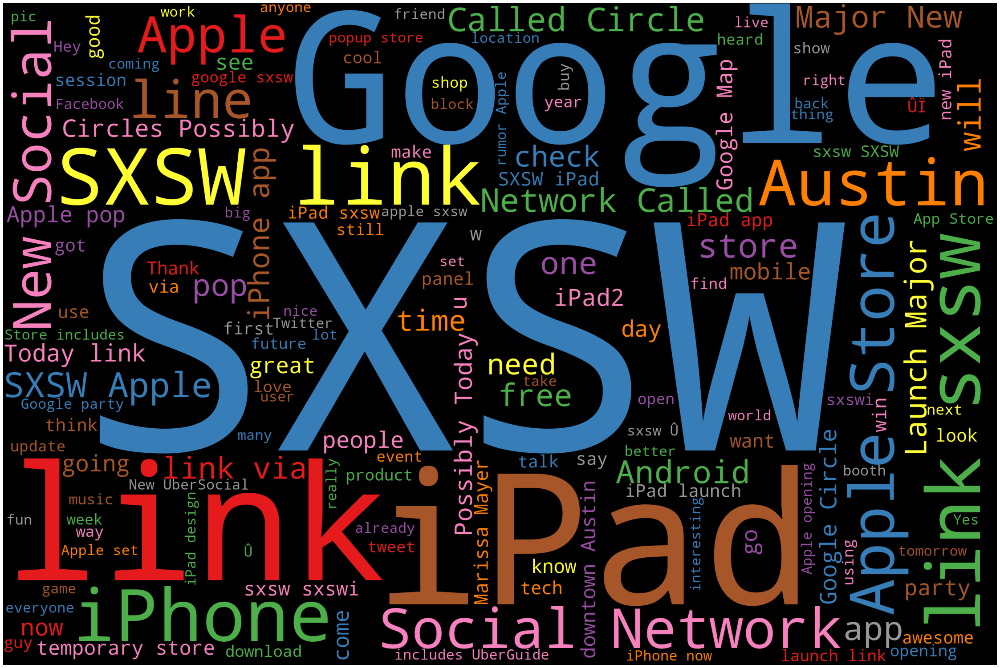

In [644]:
# Generate Word Cloud

STOPWORDS.add('pron')
STOPWORDS.add('rt')
STOPWORDS.add('yeah')
wordcloud=WordCloud(width=3000,height=2000,background_color='black',max_words=150,
                   colormap='Set1',stopwords=STOPWORDS).generate(data_Product_Description)
plot_cloud(wordcloud)

In [645]:
# Tokenization
import nltk
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [646]:
from nltk.tokenize import word_tokenize
text_tokens=word_tokenize(no_url_text)
print(text_tokens)

['The', 'Web', 'Designer', '\x89', 'Ûªs', 'Guide', 'to', 'iOS', 'and', 'Android', 'Apps', 'today', '10', 'a', 'm', 'link', 'sxsw', 'RT', 'Line', 'for', 'iPad', '2', 'is', 'longer', 'today', 'than', 'yesterday', 'SXSW', 'are', 'you', 'getting', 'in', 'line', 'again', 'today', 'just', 'for', 'fun', 'Crazy', 'that', 'Apple', 'is', 'opening', 'a', 'temporary', 'store', 'in', 'Austin', 'tomorrow', 'to', 'handle', 'the', 'rabid', 'sxsw', 'eye', 'pad', 'too', 'seekers', 'The', 'lesson', 'from', 'Google', 'One', 'Pass', 'In', 'this', 'digital', 'environment', 'users', 'want', 'to', 'purchase', 'across', 'every', 'platform', 'with', 'one', 'tool', 'sxsw', 'elonsxsw', 'RT', 'At', 'the', 'panel', 'Your', 'mom', 'has', 'an', 'ipad', 'designing', 'for', 'boomers', 'sxsw', 'RT', 'I', 'think', 'my', 'effing', 'hubby', 'is', 'in', 'line', 'for', 'an', 'iPad', '2', 'Can', 'someone', 'point', 'him', 'towards', 'the', 'lineup', 'for', 'wife', 'number', '2', 'sxswi', 'sxsw', 'Android', 'users', 'are', 'no

In [647]:
from nltk.tokenize import word_tokenize
text_tokens=word_tokenize(no_url_text)
#print(text_tokens)
# Tokens count
len(text_tokens)

108032

In [648]:
# Remove Stopwords
from nltk.corpus import stopwords
my_stop_words=stopwords.words('english')

sw_list = ['\x92','rt','ye','yeah','haha','Yes','U0001F923','I','Free',"sxsw","@","rt","re","w","u","m","s","sxswi","mention","link","amp","sx","sw","wi","sxs","google","app",
                       "phone","pad","apple","austin","quot","android","ipad","marissa","mayer","social","network","store",
                       "via","popup","called","zlf","zms","quotmajorquot"]
my_stop_words.extend(sw_list)

no_stop_tokens=[word for word in text_tokens if not word in my_stop_words]
print(no_stop_tokens)

['The', 'Web', 'Designer', '\x89', 'Ûªs', 'Guide', 'iOS', 'Android', 'Apps', 'today', '10', 'RT', 'Line', 'iPad', '2', 'longer', 'today', 'yesterday', 'SXSW', 'getting', 'line', 'today', 'fun', 'Crazy', 'Apple', 'opening', 'temporary', 'Austin', 'tomorrow', 'handle', 'rabid', 'eye', 'seekers', 'The', 'lesson', 'Google', 'One', 'Pass', 'In', 'digital', 'environment', 'users', 'want', 'purchase', 'across', 'every', 'platform', 'one', 'tool', 'elonsxsw', 'RT', 'At', 'panel', 'Your', 'mom', 'designing', 'boomers', 'RT', 'think', 'effing', 'hubby', 'line', 'iPad', '2', 'Can', 'someone', 'point', 'towards', 'lineup', 'wife', 'number', '2', 'Android', 'users', 'iPhone', 'users', 'They', 'use', 'Options', 'menu', 'Contextual', 'menu', 'Wow', 'RT', 'We', 'interrupt', 'regularly', 'scheduled', 'geek', 'programming', 'big', 'news', 'circles', 'Google', 'Launch', 'New', 'Social', 'Network', 'Called', 'Circles', 'Possibly', 'Today', 'SXSW', 'Welcome', 'Enjoy', 'Sxsw', 'ride', 'anywhere', 'Austin', 

In [649]:
# Normalize the data
lower_words=[Text.lower() for Text in no_stop_tokens]
print(lower_words[100:200])

['possibly', 'today', 'sxsw', 'welcome', 'enjoy', 'sxsw', 'ride', 'anywhere', 'austin', '10', 'dwnld', 'groundlink', 'booth', '437', 'rt', 'apple', 'plans', 'keep', 'austin', 'wired', 'opening', 'apple', 'sxsw', 'yeay', 'rt', 'new', 'ubersocial', 'iphone', 'app', 'store', 'includes', 'uberguide', 'sxsw', 'sponsored', 'masha', 'you', 'know', 'sxsw', 'season', '10', 'updates', 'whenever', 'open', 'iphone', 'rt', 'rt', 'arriving', 'us', 'looking', 'microsim', 'data', 'iphone', 'recommendations', '\x89', 'ûï', 'its', 'rumor', 'apple', 'opening', 'temporary', 'downtown', 'austin', 'sxsw', 'ipad', '2', 'launch', 'horrible', 'repressed', 'memories', 'apple', 'spinning', 'beach', 'ball', 'coming', 'back', 'progressbar', 'talk', 'saw', 'man', 'drop', 'iphone', 'gutter', 'last', 'year', 'sxsw', 'rt', 'social', 'is', 'too', 'important', 'for', 'google', 'to', 'screw', 'up', 'with', 'a', 'big', 'launch', 'circus']


In [650]:
# Stemming (Optional)
from nltk.stem import PorterStemmer
ps=PorterStemmer()
stemmed_tokens=[ps.stem(word) for word in lower_words]
print(stemmed_tokens[100:200])

['possibl', 'today', 'sxsw', 'welcom', 'enjoy', 'sxsw', 'ride', 'anywher', 'austin', '10', 'dwnld', 'groundlink', 'booth', '437', 'rt', 'appl', 'plan', 'keep', 'austin', 'wire', 'open', 'appl', 'sxsw', 'yeay', 'rt', 'new', 'ubersoci', 'iphon', 'app', 'store', 'includ', 'uberguid', 'sxsw', 'sponsor', 'masha', 'you', 'know', 'sxsw', 'season', '10', 'updat', 'whenev', 'open', 'iphon', 'rt', 'rt', 'arriv', 'us', 'look', 'microsim', 'data', 'iphon', 'recommend', '\x89', 'ûï', 'it', 'rumor', 'appl', 'open', 'temporari', 'downtown', 'austin', 'sxsw', 'ipad', '2', 'launch', 'horribl', 'repress', 'memori', 'appl', 'spin', 'beach', 'ball', 'come', 'back', 'progressbar', 'talk', 'saw', 'man', 'drop', 'iphon', 'gutter', 'last', 'year', 'sxsw', 'rt', 'social', 'is', 'too', 'import', 'for', 'googl', 'to', 'screw', 'up', 'with', 'a', 'big', 'launch', 'circu']


In [651]:
# Lemmatization
nlp=spacy.load('en_core_web_sm')
doc=nlp(' '.join(lower_words))
print(doc)

the web designer  ûªs guide ios android apps today 10 rt line ipad 2 longer today yesterday sxsw getting line today fun crazy apple opening temporary austin tomorrow handle rabid eye seekers the lesson google one pass in digital environment users want purchase across every platform one tool elonsxsw rt at panel your mom designing boomers rt think effing hubby line ipad 2 can someone point towards lineup wife number 2 android users iphone users they use options menu contextual menu wow rt we interrupt regularly scheduled geek programming big news circles google launch new social network called circles possibly today sxsw welcome enjoy sxsw ride anywhere austin 10 dwnld groundlink booth 437 rt apple plans keep austin wired opening apple sxsw yeay rt new ubersocial iphone app store includes uberguide sxsw sponsored masha you know sxsw season 10 updates whenever open iphone rt rt arriving us looking microsim data iphone recommendations  ûï its rumor apple opening temporary downtown austi

In [652]:
lemmas=[token.lemma_ for token in doc]
print(lemmas)

['the', 'web', 'designer', '\x89', 'ûªs', 'guide', 'io', 'android', 'app', 'today', '10', 'rt', 'line', 'ipad', '2', 'long', 'today', 'yesterday', 'sxsw', 'get', 'line', 'today', 'fun', 'crazy', 'apple', 'open', 'temporary', 'austin', 'tomorrow', 'handle', 'rabid', 'eye', 'seeker', 'the', 'lesson', 'google', 'one', 'pass', 'in', 'digital', 'environment', 'user', 'want', 'purchase', 'across', 'every', 'platform', 'one', 'tool', 'elonsxsw', 'rt', 'at', 'panel', 'your', 'mom', 'design', 'boomer', 'rt', 'think', 'eff', 'hubby', 'line', 'ipad', '2', 'can', 'someone', 'point', 'towards', 'lineup', 'wife', 'number', '2', 'android', 'user', 'iphone', 'user', 'they', 'use', 'option', 'menu', 'contextual', 'menu', 'wow', 'rt', 'we', 'interrupt', 'regularly', 'schedule', 'geek', 'program', 'big', 'news', 'circle', 'google', 'launch', 'new', 'social', 'network', 'call', 'circle', 'possibly', 'today', 'sxsw', 'welcome', 'enjoy', 'sxsw', 'ride', 'anywhere', 'austin', '10', 'dwnld', 'groundlink', 'bo

In [653]:
clean_tweets=' '.join(lemmas)
clean_tweets

'the web designer \x89 ûªs guide io android app today 10 rt line ipad 2 long today yesterday sxsw get line today fun crazy apple open temporary austin tomorrow handle rabid eye seeker the lesson google one pass in digital environment user want purchase across every platform one tool elonsxsw rt at panel your mom design boomer rt think eff hubby line ipad 2 can someone point towards lineup wife number 2 android user iphone user they use option menu contextual menu wow rt we interrupt regularly schedule geek program big news circle google launch new social network call circle possibly today sxsw welcome enjoy sxsw ride anywhere austin 10 dwnld groundlink booth 437 rt apple plan keep austin wire open apple sxsw yeay rt new ubersocial iphone app store include uberguide sxsw sponsor masha you know sxsw season 10 update whenever open iphone rt rt arrive we look microsim datum iphone recommendation \x89 ûï its rumor apple open temporary downtown austin sxsw ipad 2 launch horrible repressed me

In [654]:
#COUNT VECTORIZER
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()
tweetscv=cv.fit_transform(lemmas)

In [655]:
print(cv.get_feature_names()[100:200])

['245', '24587', '247', '25', '25000', '250k', '268', '27', '270', '2b', '2day', '2h', '2honor', '2it', '2moro', '2nd', '2nite', '2rd', '2s', '2wk', '2wks', '2x', '2yr', '2yrs', '2åê', '30', '300', '3000', '3045', '30k', '30min', '30mio', '30th', '31', '310', '310409h2011', '311', '312', '313', '314', '315', '317', '318', '319', '32', '320', '32000', '322', '33', '330', '339', '34', '345', '35', '350', '359', '36', '360', '360idev', '37', '38', '3blks', '3d', '3gs', '3k', '3rd', '3x', '40', '400', '40min', '41', '420', '43', '430', '437', '44', '445', '45', '450', '47', '48', '4999', '4android', '4chan', '4chan4eva', '4hb', '4sq', '4sq3', '4sqchat', '4sqs', '4square', '4sqwill', '4th', '4this', '4thought', '50', '500', '5000', '504', '506']


In [656]:
print(tweetscv.toarray()[100:200])

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [657]:
cv_ngram_range=CountVectorizer(analyzer='word',ngram_range=(1,3),max_features=100)
bow_matrix_ngram=cv_ngram_range.fit_transform(lemmas)

In [658]:
print(cv_ngram_range.get_feature_names())
print(bow_matrix_ngram.toarray())

['android', 'app', 'apple', 'around', 'at', 'austin', 'awesome', 'be', 'big', 'buy', 'call', 'can', 'check', 'circle', 'come', 'cool', 'day', 'design', 'do', 'download', 'downtown', 'find', 'first', 'free', 'game', 'get', 'give', 'go', 'good', 'google', 'great', 'guy', 'if', 'ipad', 'ipad2', 'iphone', 'its', 'just', 'know', 'launch', 'like', 'line', 'look', 'love', 'major', 'make', 'map', 'marissa', 'mayer', 'mobile', 'music', 'need', 'network', 'new', 'news', 'next', 'not', 'one', 'open', 'panel', 'party', 'people', 'pop', 'possibly', 'product', 're', 'rt', 'rumor', 'say', 'search', 'see', 'sell', 'set', 'shop', 'show', 'social', 'store', 'sxsw', 'sxswi', 'take', 'talk', 'tech', 'temporary', 'thank', 'the', 'think', 'time', 'today', 'tweet', 'update', 'use', 'user', 'want', 'we', 'well', 'what', 'win', 'year', 'you', 'ûï']
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [659]:
print(cv_ngram_range.get_feature_names())
print(bow_matrix_ngram.toarray())

['android', 'app', 'apple', 'around', 'at', 'austin', 'awesome', 'be', 'big', 'buy', 'call', 'can', 'check', 'circle', 'come', 'cool', 'day', 'design', 'do', 'download', 'downtown', 'find', 'first', 'free', 'game', 'get', 'give', 'go', 'good', 'google', 'great', 'guy', 'if', 'ipad', 'ipad2', 'iphone', 'its', 'just', 'know', 'launch', 'like', 'line', 'look', 'love', 'major', 'make', 'map', 'marissa', 'mayer', 'mobile', 'music', 'need', 'network', 'new', 'news', 'next', 'not', 'one', 'open', 'panel', 'party', 'people', 'pop', 'possibly', 'product', 're', 'rt', 'rumor', 'say', 'search', 'see', 'sell', 'set', 'shop', 'show', 'social', 'store', 'sxsw', 'sxswi', 'take', 'talk', 'tech', 'temporary', 'thank', 'the', 'think', 'time', 'today', 'tweet', 'update', 'use', 'user', 'want', 'we', 'well', 'what', 'win', 'year', 'you', 'ûï']
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [660]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidfv_ngram_max_features=TfidfVectorizer(norm='l2',analyzer='word',ngram_range=(1,3),max_features=500)
tfidf_matix_ngram=tfidfv_ngram_max_features.fit_transform(lemmas)

In [661]:
print(tfidfv_ngram_max_features.get_feature_names())
print(tfidf_matix_ngram.toarray())

['10', '11', '150', '1st', '20', '2011', '2s', '40', '59p', '6th', '80', 'able', 'access', 'aclu', 'action', 'actually', 'all', 'already', 'also', 'amazing', 'and', 'android', 'announce', 'another', 'any', 'anyone', 'anything', 'app', 'apple', 'around', 'art', 'artist', 'ask', 'at', 'attend', 'attendee', 'austin', 'available', 'award', 'away', 'awesome', 'back', 'bad', 'ballroom', 'band', 'bar', 'base', 'battery', 'be', 'before', 'begin', 'big', 'bing', 'blackberry', 'block', 'blog', 'book', 'booth', 'brain', 'brand', 'brilliant', 'bring', 'build', 'business', 'but', 'buy', 'buzz', 'call', 'camera', 'can', 'card', 'case', 'cc', 'center', 'chance', 'change', 'charge', 'charger', 'check', 'checkin', 'choice', 'circle', 'cnet', 'cnn', 'code', 'come', 'company', 'conference', 'congress', 'connect', 'cont', 'content', 'convention', 'cool', 'core', 'could', 'create', 'crowd', 'daily', 'datum', 'day', 'demo', 'design', 'designing', 'detail', 'developer', 'device', 'digital', 'discovery', 'do'

In [662]:
# Parts Of Speech (POS) Tagging
nlp=spacy.load('en_core_web_sm')

one_block=clean_tweets
doc_block=nlp(one_block)
spacy.displacy.render(doc_block,style='ent',jupyter=True)

In [663]:
for token in doc_block[100:200]:
    print(token,token.pos_) 

possibly ADV
today NOUN
sxsw PROPN
welcome NOUN
enjoy VERB
sxsw PROPN
ride VERB
anywhere ADV
austin PROPN
10 NUM
dwnld NOUN
groundlink NOUN
booth PROPN
437 NUM
rt PROPN
apple NOUN
plan NOUN
keep VERB
austin NOUN
wire NOUN
open ADJ
apple PROPN
sxsw PROPN
yeay PROPN
rt PROPN
new ADJ
ubersocial ADJ
iphone NOUN
app NOUN
store NOUN
include VERB
uberguide ADJ
sxsw PROPN
sponsor NOUN
masha PROPN
you PRON
know VERB
sxsw PROPN
season NOUN
10 NUM
update NOUN
whenever SCONJ
open ADJ
iphone NOUN
rt PROPN
rt PROPN
arrive PROPN
we PRON
look VERB
microsim PROPN
datum PROPN
iphone NOUN
recommendation NOUN
 NOUN
ûï ADP
its PRON
rumor NOUN
apple NOUN
open ADJ
temporary ADJ
downtown NOUN
austin NOUN
sxsw PROPN
ipad PROPN
2 PROPN
launch NOUN
horrible ADJ
repressed ADJ
memory NOUN
apple NOUN
spinning VERB
beach NOUN
ball NOUN
come VERB
back ADV
progressbar NOUN
talk NOUN
see VERB
man NOUN
drop VERB
iphone NOUN
gutter NOUN
last ADJ
year NOUN
sxsw PROPN
rt PROPN
social PROPN
be AUX
too ADV
important ADJ
for

In [664]:
# Filtering the nouns and verbs only
nouns_verbs=[token.text for token in doc_block if token.pos_ in ('NOUN','VERB')]
print(nouns_verbs[100:200])

['iphone', 'gutter', 'year', 'screw', 'launch', 'circus', 'day', 'business', 'apple', 'appear', 'trend', 'enjoy', 'music', 'sampler', 'itune', 'enchantment', 'sell', 'dream', 'job', 'say', 'iphone', 'part', 't', 'make', 'thank', 'publishing', 'tomorrow', 'speak', 'chromeo', 'exhibit', 'hall', 'pm', 'ipad', 'hand', 'dude', 'give', 'hour', 'line', 'win', 'shop', 'do', 'iphone', 'thank', 'make', 'event', 'appear', 'work', 'tweet', 'register', 'pass', 'event', 'ipad', 'give', 'cont', 'travel', 'win', 'webdoccom', 'tech', 'ouch', 'google', 'bing', 'respect', 'bing', 'guy', 'invite', 'fill', 'chair', 'rt', 'thing', 'hear', 'wknd', 'give', 'money', 'relief', 'need', 'ipad', 'austin', 'get', 'tell', 'iphone', 'brick', 'crowd', 'report', 'scene', 'song', 'download', 'feature', 'album', 'feature', 'mix', 'itune', 'recommendation', 'engine', 'session', 'thank', 'pandora', 'youtube', 'stumbledupon', 'couple', 'evo']


In [665]:
# Counting the noun & verb tokens
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()

X=cv.fit_transform(nouns_verbs)
sum_words=X.sum(axis=0)

words_freq=[(word,sum_words[0,idx]) for word,idx in cv.vocabulary_.items()]
words_freq=sorted(words_freq, key=lambda x: x[1], reverse=True)

wd_df=pd.DataFrame(words_freq)
wd_df.columns=['word','count']
wd_df[0:10] # viewing top ten results

,word,count
0,ipad,1165
1,iphone,907
2,apple,898
3,launch,547
4,get,442
5,today,416
6,austin,405
7,go,355
8,line,311
9,store,283


In [666]:
# Counting the noun & verb tokens
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()

X=cv.fit_transform(nouns_verbs)
sum_words=X.sum(axis=0)

words_freq=[(word,sum_words[0,idx]) for word,idx in cv.vocabulary_.items()]
words_freq=sorted(words_freq, key=lambda x: x[1], reverse=True)

wd_df=pd.DataFrame(words_freq)
wd_df.columns=['word','count']
wd_df[0:10] # viewing top ten results

,word,count
0,ipad,1165
1,iphone,907
2,apple,898
3,launch,547
4,get,442
5,today,416
6,austin,405
7,go,355
8,line,311
9,store,283


DEPLOY 8

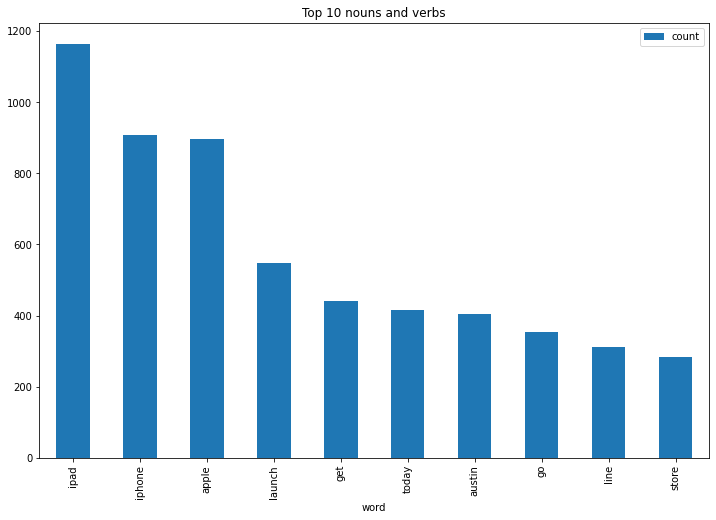

In [667]:
# Visualizing results (Barchart for top 10 nouns + verbs)
wd_df[0:10].plot.bar(x='word',figsize=(12,8),title='Top 10 nouns and verbs');

In [668]:
# Filtering the adjectives only
adj=[token.text for token in doc_block if token.pos_ in ('ADJ')]
print(adj[100:200])

['south', 'good', 'special', 'open', '6th', 'smart', 'impressive', 'ipad', 'first', 'great', 'mobile', 'large', 'free', 'lonely', 'limited', '\x9d', 'free', 'happy', 'semantic', 'hilarious', 'new', 'early', 'long', 'many', 'closed', 'fb', 'major', 'new', 'social', 'digital', 'real', 'breathtaking', 'visual', 'clear', 'essential', 'new', 'great', 'effective', '3gs', 'greatergood', 'new', 'social', 'android', 'private', 'slow', 'early', 'awesome', 'sweepstake', 'giveaway', '6th', 'interactive', 'augmented', 'mobile', 'physical', 'nice', 'true', 'hungry', 'great', 'vietnamese', '6th', 'ajax', 'happy', 'able', 'new', 'cool', 'new', 'open', 'temporary', 'free', 'tradeshow', 'ill', 'ahhh', '\x89', 'ûï', 'major', 'new', 'social', '\x9d', 'great', 'awesome', 'ipad', 'quibid', 'stupid', 'able', 'excellent', 'great', 'third', 'new', 'open', 'temporary', 'fascist', '\x9d', '6th', 'st', 'close', 'apptastic', 'ill', 'major', 'new', 'social']


In [669]:
# Counting the Adjective tokens
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()

X=cv.fit_transform(adj)
sum_words=X.sum(axis=0)

words_freq=[(word,sum_words[0,idx]) for word,idx in cv.vocabulary_.items()]
words_freq=sorted(words_freq, key=lambda x: x[1], reverse=True)

wd_df=pd.DataFrame(words_freq)
wd_df.columns=['word','count']
wd_df[0:10] # viewing top ten results

,word,count
0,new,708
1,open,293
2,social,258
3,major,211
4,free,199
5,temporary,173
6,good,165
7,great,138
8,mobile,117
9,big,90


DEPLOY 9

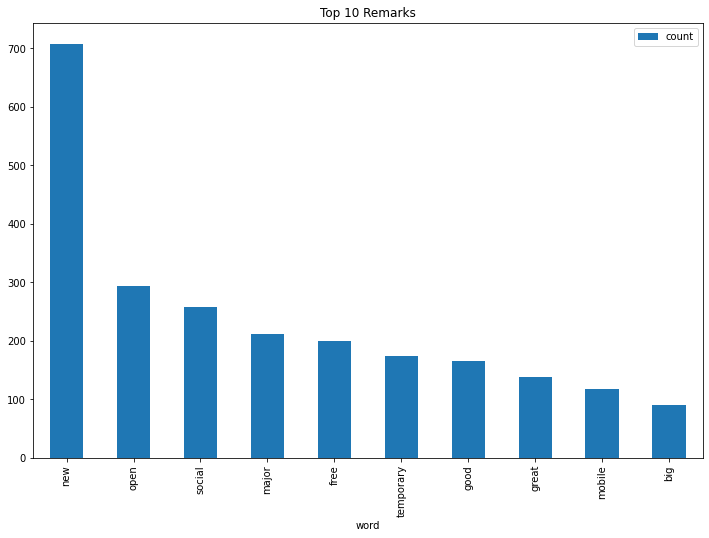

In [670]:
# Visualizing results (Barchart for top 10 Remarks)
wd_df[0:10].plot.bar(x='word',figsize=(12,8),title='Top 10 Remarks');

In [671]:
from nltk import tokenize
sentences=tokenize.sent_tokenize(' '.join(df))
sentences

['The Web Designer\x89Ûªs Guide to iOS (and Android) Apps, today @mention 10 a.m!',
 '{link} #sxsw RT @mention Line for iPad 2 is longer today than yesterday.',
 '#SXSW  // are you getting in line again today just for fun?',
 'Crazy that Apple is opening a temporary store in Austin tomorrow to handle the rabid #sxsw eye pad too seekers.',
 'The lesson from Google One Pass: In this digital environment, users want to purchase across every platform with one tool.',
 '#sxsw #elonsxsw RT @mention At the panel: &quot;Your mom has an ipad, designing for boomers&quot; #sxsw RT @mention I think my effing hubby is in line for an #iPad 2.',
 'Can someone point him towards the line-up for wife number #2.',
 '#sxswi #sxsw &quot;Android users are not iPhone users.',
 '(They use the Options menu, and Contextual menu)&quot; ~@mention #sxsw Wow!',
 'RT@mention We interrupt your regularly scheduled #sxsw geek programming with big news {link}  #google #circles Google to Launch New Social Network Called C

In [672]:
import textblob

In [673]:
sent_df=pd.DataFrame(sentences,columns=['sentence'])
sent_df

,sentence
0,The Web DesignerÛªs Guide to iOS (and Android...
1,{link} #sxsw RT @mention Line for iPad 2 is lo...
2,#SXSW // are you getting in line again today ...
3,Crazy that Apple is opening a temporary store ...
4,The lesson from Google One Pass: In this digit...
...,...
6417,Thanks @mention for hosting this event #sxsw #...
6418,#sxsw RT @mention RT @mention Download 20+ fre...
6419,{link} #SXSW OH at Texas Social Media Awards: ...
6420,Just Google it.'


In [674]:
import os
import pandas as pd
import io
from google.colab import files
 
 
uploaded1 = files.upload()


Saving Afinn (2).csv to Afinn (2) (4).csv


In [675]:
afinn = pd.read_csv(r'Afinn (2).csv', sep=',', encoding='latin-1')
afinn.shape

(2477, 2)

In [676]:
#review to individual sentences
sent_df = pd.DataFrame(sentences, columns=['sentence'])
sent_df.head()

,sentence
0,The Web DesignerÛªs Guide to iOS (and Android...
1,{link} #sxsw RT @mention Line for iPad 2 is lo...
2,#SXSW // are you getting in line again today ...
3,Crazy that Apple is opening a temporary store ...
4,The lesson from Google One Pass: In this digit...


In [677]:
stemmer = PorterStemmer()

#preprocess function 
stem_words=lambda x: stemmer.stem(x)
break_into_words = lambda x : re.findall("[a-zA-Z0-9]+", x)
skip_numeric = lambda x : [w for w in x if not w.isnumeric()]

#apply pre-processing steps
processed_text=sent_df["sentence"].map(break_into_words)\
        .map(skip_numeric)
sent_df["processed"]=processed_text

In [678]:
#creating a dictionary for affin scores
affinity_scores = afinn.set_index('word')['value'].to_dict()

In [679]:
#Custom function :score each word in a sentence in lemmatised form,but calculate the score for the whole original sentence.
nlp = spacy.load('en_core_web_sm')
sentiment_lexicon = affinity_scores
# user defined function to calculate aggregate scores
def calculate_sentiment(text: str = None):
    sent_score = 0
    if text:
        sentence = nlp(text)
        for word in sentence:
            sent_score += sentiment_lexicon.get(word.lemma_, 0)
    return sent_score

def sentimnt(h):
  if h > 3:
    return 1
  elif h <= 3 and h >= 1:
    return 0
  elif h < 1:
    return -1  

In [680]:
#sentiment on whole text
sent_df['sentiment_value'] = sent_df['sentence'].apply(calculate_sentiment)
sent_df['word_count'] = sent_df['sentence'].str.split().apply(len)
sent_df['SentimentScore']=sent_df['sentiment_value'].apply(sentimnt)


DEPLOY 1

In [681]:
sent_df.head()

,sentence,processed,sentiment_value,word_count,SentimentScore
0,The Web DesignerÛªs Guide to iOS (and Android...,"[The, Web, Designer, s, Guide, to, iOS, and, A...",0,13,-1
1,{link} #sxsw RT @mention Line for iPad 2 is lo...,"[link, sxsw, RT, mention, Line, for, iPad, is,...",0,13,-1
2,#SXSW // are you getting in line again today ...,"[SXSW, are, you, getting, in, line, again, tod...",4,12,1
3,Crazy that Apple is opening a temporary store ...,"[Crazy, that, Apple, is, opening, a, temporary...",0,20,-1
4,The lesson from Google One Pass: In this digit...,"[The, lesson, from, Google, One, Pass, In, thi...",1,20,0


In [682]:
sent_df

,sentence,processed,sentiment_value,word_count,SentimentScore
0,The Web DesignerÛªs Guide to iOS (and Android...,"[The, Web, Designer, s, Guide, to, iOS, and, A...",0,13,-1
1,{link} #sxsw RT @mention Line for iPad 2 is lo...,"[link, sxsw, RT, mention, Line, for, iPad, is,...",0,13,-1
2,#SXSW // are you getting in line again today ...,"[SXSW, are, you, getting, in, line, again, tod...",4,12,1
3,Crazy that Apple is opening a temporary store ...,"[Crazy, that, Apple, is, opening, a, temporary...",0,20,-1
4,The lesson from Google One Pass: In this digit...,"[The, lesson, from, Google, One, Pass, In, thi...",1,20,0
...,...,...,...,...,...
6417,Thanks @mention for hosting this event #sxsw #...,"[Thanks, mention, for, hosting, this, event, s...",4,21,1
6418,#sxsw RT @mention RT @mention Download 20+ fre...,"[sxsw, RT, mention, RT, mention, Download, fre...",1,16,0
6419,{link} #SXSW OH at Texas Social Media Awards: ...,"[link, SXSW, OH, at, Texas, Social, Media, Awa...",0,16,-1
6420,Just Google it.',"[Just, Google, it]",0,3,-1


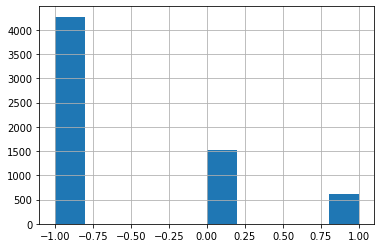

In [683]:
sent_df['SentimentScore'].hist()

In [684]:
sent_df['index']=range(0,len(sent_df))
sent_df

,sentence,processed,sentiment_value,word_count,SentimentScore,index
0,The Web DesignerÛªs Guide to iOS (and Android...,"[The, Web, Designer, s, Guide, to, iOS, and, A...",0,13,-1,0
1,{link} #sxsw RT @mention Line for iPad 2 is lo...,"[link, sxsw, RT, mention, Line, for, iPad, is,...",0,13,-1,1
2,#SXSW // are you getting in line again today ...,"[SXSW, are, you, getting, in, line, again, tod...",4,12,1,2
3,Crazy that Apple is opening a temporary store ...,"[Crazy, that, Apple, is, opening, a, temporary...",0,20,-1,3
4,The lesson from Google One Pass: In this digit...,"[The, lesson, from, Google, One, Pass, In, thi...",1,20,0,4
...,...,...,...,...,...,...
6417,Thanks @mention for hosting this event #sxsw #...,"[Thanks, mention, for, hosting, this, event, s...",4,21,1,6417
6418,#sxsw RT @mention RT @mention Download 20+ fre...,"[sxsw, RT, mention, RT, mention, Download, fre...",1,16,0,6418
6419,{link} #SXSW OH at Texas Social Media Awards: ...,"[link, SXSW, OH, at, Texas, Social, Media, Awa...",0,16,-1,6419
6420,Just Google it.',"[Just, Google, it]",0,3,-1,6420


In [685]:
sent_df

,sentence,processed,sentiment_value,word_count,SentimentScore,index
0,The Web DesignerÛªs Guide to iOS (and Android...,"[The, Web, Designer, s, Guide, to, iOS, and, A...",0,13,-1,0
1,{link} #sxsw RT @mention Line for iPad 2 is lo...,"[link, sxsw, RT, mention, Line, for, iPad, is,...",0,13,-1,1
2,#SXSW // are you getting in line again today ...,"[SXSW, are, you, getting, in, line, again, tod...",4,12,1,2
3,Crazy that Apple is opening a temporary store ...,"[Crazy, that, Apple, is, opening, a, temporary...",0,20,-1,3
4,The lesson from Google One Pass: In this digit...,"[The, lesson, from, Google, One, Pass, In, thi...",1,20,0,4
...,...,...,...,...,...,...
6417,Thanks @mention for hosting this event #sxsw #...,"[Thanks, mention, for, hosting, this, event, s...",4,21,1,6417
6418,#sxsw RT @mention RT @mention Download 20+ fre...,"[sxsw, RT, mention, RT, mention, Download, fre...",1,16,0,6418
6419,{link} #SXSW OH at Texas Social Media Awards: ...,"[link, SXSW, OH, at, Texas, Social, Media, Awa...",0,16,-1,6419
6420,Just Google it.',"[Just, Google, it]",0,3,-1,6420


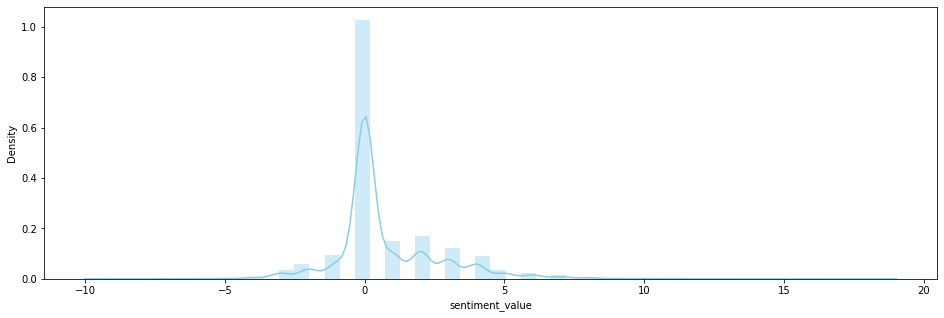

In [686]:
plt.figure(figsize=(16, 5))
sns.distplot(sent_df['sentiment_value'],color="skyblue");

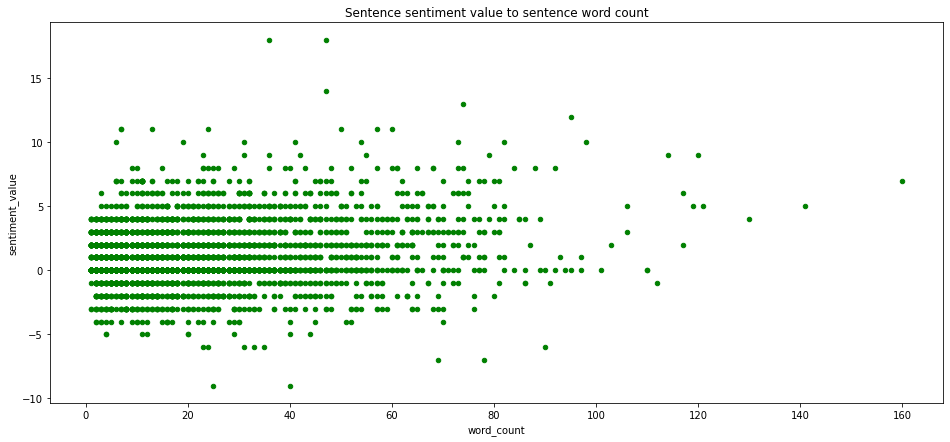

In [687]:
sent_df.plot.scatter(x='word_count',y='sentiment_value',figsize=(16,7),title='Sentence sentiment value to sentence word count',color="g");

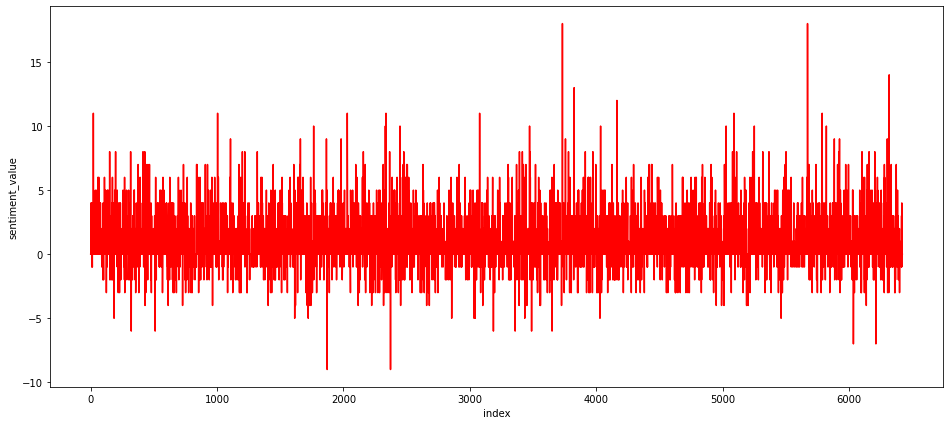

In [688]:
plt.figure(figsize=(16, 7))
sns.lineplot(y='sentiment_value', x = 'index', data=sent_df,color="red");

In [689]:
import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt
import string
import spacy 
from wordcloud import WordCloud


DEPLOY 3

In [690]:
df = pd.read_csv(io.BytesIO(uploaded[r'Product_details - Copy.csv']))
#classifying ratings

good_rate = len(df[df['Sentiment']>2])
average_rate=len(df[df['Sentiment']==2])
poor_rate=len(df[df['Sentiment']<=1])


#######################################################

print("Good Rating = ",good_rate)
print("average_rate = ",average_rate)
print("poor_rate = ",poor_rate)

Good Rating =  2089
average_rate =  3765
poor_rate =  510


In [691]:
total = len(df)
print('Total number of product description = ',total)

Total number of product description =  6364


In [692]:
print("Number of unique text id :",len(df['Text_ID'].unique()))

Number of unique text id : 6364


In [693]:
# Statistics of non-numeric variables

# Number of unique customers
print('\nNumber of unique customers : {}'.format(len(df['Text_ID'].unique())))
      
# Number of unique products
print('\nNumber of unique products : {}'.format(len(df['Product_Type'].unique())))


Number of unique customers : 6364

Number of unique products : 10


In [694]:
x = df['Product_Description'] 
x

0       The Web DesignerÛªs Guide to iOS (and Android...
1       RT @mention Line for iPad 2 is longer today th...
2       Crazy that Apple is opening a temporary store ...
3       The lesson from Google One Pass: In this digit...
4       RT @mention At the panel: &quot;Your mom has a...
                              ...                        
6359    Thanks @mention for hosting this event #sxsw #...
6360    SXSW iPhone app is awesome, but iPad app crash...
6361    RT @mention RT @mention Download 20+ free trac...
6362    OH at Texas Social Media Awards: 'You don't ne...
6363    #Google launching a &quot;major&quot; new soci...
Name: Product_Description, Length: 6364, dtype: object

In [695]:
df

,Text_ID,Product_Description,Product_Type,Sentiment
0,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2
1,6254,RT @mention Line for iPad 2 is longer today th...,9,2
2,8212,Crazy that Apple is opening a temporary store ...,9,2
3,4422,The lesson from Google One Pass: In this digit...,9,2
4,5526,RT @mention At the panel: &quot;Your mom has a...,9,2
...,...,...,...,...
6359,2945,Thanks @mention for hosting this event #sxsw #...,9,2
6360,4528,"SXSW iPhone app is awesome, but iPad app crash...",7,1
6361,6526,RT @mention RT @mention Download 20+ free trac...,9,2
6362,2110,OH at Texas Social Media Awards: 'You don't ne...,9,2


In [696]:
sent_df=pd.DataFrame(sentences,columns=['sentence'])
sent_df

,sentence
0,The Web DesignerÛªs Guide to iOS (and Android...
1,{link} #sxsw RT @mention Line for iPad 2 is lo...
2,#SXSW // are you getting in line again today ...
3,Crazy that Apple is opening a temporary store ...
4,The lesson from Google One Pass: In this digit...
...,...
6417,Thanks @mention for hosting this event #sxsw #...
6418,#sxsw RT @mention RT @mention Download 20+ fre...
6419,{link} #SXSW OH at Texas Social Media Awards: ...
6420,Just Google it.'


In [697]:
# how many words are there in a sentence?
sent_df['word_count']=sent_df['sentence'].str.split().apply(len)
sent_df['word_count']

0       13
1       13
2       12
3       20
4       20
        ..
6417    21
6418    16
6419    16
6420     3
6421    17
Name: word_count, Length: 6422, dtype: int64

In [698]:
# Import pandas package
import pandas as pd

# Define a dictionary containing Students data
#data = {'Name': ['Jai', 'Princi', 'Gaurav', 'Anuj'],
#		'Height': [5.1, 6.2, 5.1, 5.2],
#		'Qualification': ['Msc', 'MA', 'Msc', 'Msc']}

# Convert the dictionary into DataFrame


# Declare a list that is to be converted into a column
#WordCount = ['word_count']

# Using 'Address' as the column name
# and equating it to the list
#df['WordCount'] = WordCount

# Observe the result
#print(df)
sent_df['word_count']

0       13
1       13
2       12
3       20
4       20
        ..
6417    21
6418    16
6419    16
6420     3
6421    17
Name: word_count, Length: 6422, dtype: int64

In [699]:
wc=sent_df['word_count']
df.join(wc)

,Text_ID,Product_Description,Product_Type,Sentiment,word_count
0,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2,13
1,6254,RT @mention Line for iPad 2 is longer today th...,9,2,13
2,8212,Crazy that Apple is opening a temporary store ...,9,2,12
3,4422,The lesson from Google One Pass: In this digit...,9,2,20
4,5526,RT @mention At the panel: &quot;Your mom has a...,9,2,20
...,...,...,...,...,...
6359,2945,Thanks @mention for hosting this event #sxsw #...,9,2,6
6360,4528,"SXSW iPhone app is awesome, but iPad app crash...",7,1,5
6361,6526,RT @mention RT @mention Download 20+ free trac...,9,2,11
6362,2110,OH at Texas Social Media Awards: 'You don't ne...,9,2,9


In [700]:
def avg_word(sentences):
  words = sentences.split()
  return (sum(len(word) for word in words)/len(words))

df['avg_word'] = df['Product_Description'].apply(lambda x: avg_word(x))
df[['Product_Description','avg_word']].head()

,Product_Description,avg_word
0,The Web DesignerÛªs Guide to iOS (and Android...,5.000000
1,RT @mention Line for iPad 2 is longer today th...,4.173913
2,Crazy that Apple is opening a temporary store ...,4.600000
3,The lesson from Google One Pass: In this digit...,5.272727
4,RT @mention At the panel: &quot;Your mom has a...,5.285714


In [701]:
stop = stopwords.words('english')

df['stopwords'] = df['Product_Description'].apply(lambda x: len([x for x in x.split() if x in stop]))
df[['Product_Description','stopwords']].head()

,Product_Description,stopwords
0,The Web DesignerÛªs Guide to iOS (and Android...,1
1,RT @mention Line for iPad 2 is longer today th...,9
2,Crazy that Apple is opening a temporary store ...,7
3,The lesson from Google One Pass: In this digit...,4
4,RT @mention At the panel: &quot;Your mom has a...,4


In [702]:
df['numerics'] = df['Product_Description'].apply(lambda x: len([x for x in x.split() if x.isdigit()]))
df[['Product_Description','numerics']].head()

,Product_Description,numerics
0,The Web DesignerÛªs Guide to iOS (and Android...,1
1,RT @mention Line for iPad 2 is longer today th...,1
2,Crazy that Apple is opening a temporary store ...,0
3,The lesson from Google One Pass: In this digit...,0
4,RT @mention At the panel: &quot;Your mom has a...,0


https://towardsdatascience.com/my-absolute-go-to-for-sentiment-analysis-textblob-3ac3a11d524

TEXTBLOB LINK

https://pub.towardsai.net/16-open-source-nlp-models-for-sentiment-analysis-one-rises-on-top-b5867e247116

NLP ALGORITHM LINK

In [703]:
# importing pandas module
import pandas as pd

# importing module for regex
import re

from textblob import TextBlob

df = pd.read_csv(io.BytesIO(uploaded[r'Product_details - Copy.csv']))
def sentimen(z):
    if  z > 2:
         return 1
    elif z == 2:     
         return 0
    elif z < 2:
         return -1

def polarit(r):
    if  r > 0:
         return 1
    elif r == 0:     
         return 0
    elif r < 0:
         return -1 
def subject(q):
    if  q >= 0.6:
         return 1
    elif q >= 0.5 and q < 0.6:     
         return 0
    elif q <= 0.5:
         return -1

def senti(x):
    return TextBlob(x).sentiment.polarity
def subjecti(y):
    return TextBlob(y).sentiment.subjectivity


# String to be searched in start of string
#search ="a"

# count of occurrence of a and creating new column
df['totalwords'] = df['Product_Description'].str.split().str.len()

df['Polarity'] = df['Product_Description'].apply(senti)
df['Subjectivity'] = df['Product_Description'].apply(subjecti)
# display

df['rating'] = df['Sentiment'].apply(sentimen)
df['Polarity_rating'] = df['Polarity'].apply(polarit)
df['Subjectivity_rating'] = df['Subjectivity'].apply(subject) 
df['numerics'] = df['Product_Description'].apply(lambda x: len([x for x in x.split() if x.isdigit()]))
df['avg_word'] = df['Product_Description'].apply(lambda x: avg_word(x))
df['stopwords'] = df['Product_Description'].apply(lambda x: len([x for x in x.split() if x in stop]))


DEPLOY 2


In [704]:
df

,Text_ID,Product_Description,Product_Type,Sentiment,totalwords,Polarity,Subjectivity,rating,Polarity_rating,Subjectivity_rating,numerics,avg_word,stopwords
0,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2,15,0.000000,0.000000,0,0,-1,1,5.000000,1
1,6254,RT @mention Line for iPad 2 is longer today th...,9,2,23,0.300000,0.200000,0,1,-1,1,4.173913,9
2,8212,Crazy that Apple is opening a temporary store ...,9,2,20,-0.600000,0.900000,0,-1,1,0,4.600000,7
3,4422,The lesson from Google One Pass: In this digit...,9,2,22,0.000000,0.000000,0,0,-1,0,5.272727,4
4,5526,RT @mention At the panel: &quot;Your mom has a...,9,2,14,0.000000,0.000000,0,0,-1,0,5.285714,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6359,2945,Thanks @mention for hosting this event #sxsw #...,9,2,10,0.200000,0.200000,0,1,-1,0,6.100000,2
6360,4528,"SXSW iPhone app is awesome, but iPad app crash...",7,1,12,1.000000,1.000000,-1,1,1,0,4.583333,2
6361,6526,RT @mention RT @mention Download 20+ free trac...,9,2,17,0.500000,0.800000,0,1,1,0,5.882353,1
6362,2110,OH at Texas Social Media Awards: 'You don't ne...,9,2,19,0.033333,0.066667,0,1,-1,0,4.631579,4


Maximum Entropy is a technique that uses probability distribution estimation and widely used for a variety of natural language tasks. The challenging aspect that is different from ordinary sentiment analysis is that the comments to be analysed

In [705]:
df.pivot_table(columns=['Product_Type'], values=['Polarity','Subjectivity'])

Product_Type,0,1,2,3,4,5,6,7,8,9
Polarity,0.211133,0.229661,0.157881,0.162958,0.427725,0.155544,0.149821,0.225015,0.148490,0.082778
Subjectivity,0.464005,0.432315,0.413536,0.399473,0.700946,0.384955,0.411461,0.519194,0.459542,0.332855


In [706]:
df.pivot_table(columns=['Sentiment'], values=['Polarity','Subjectivity'])

Sentiment,0,1,2,3
Polarity,0.067807,0.009970,0.079866,0.198570
Subjectivity,0.392774,0.411138,0.328524,0.430741


In [707]:
import pandas as pd
pd.crosstab(df.Polarity,df.Sentiment).T

Polarity,-1.000000,-1.000000,-0.937500,-0.875000,-0.850000,-0.800000,-0.750000,-0.725000,-0.700000,-0.700000,...,0.800000,0.812500,0.850000,0.866667,0.875000,0.900000,0.910000,0.937500,0.976563,1.000000
Sentiment,,,,,,,,,,,,,,,,,,,,,
0,1,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,0,2
1,4,1,1,0,1,2,7,1,2,1,...,2,0,0,0,0,1,0,0,0,11
2,5,0,10,2,0,5,90,0,0,2,...,26,5,0,1,0,3,0,0,0,56
3,1,0,3,1,0,1,18,0,0,3,...,32,2,1,0,5,7,2,2,1,60


In [708]:
df3 = pd.read_csv(io.BytesIO(uploaded[r'Product_details - Copy.csv']))
def sentimen(z):
    if  z > 2:
         return 'Good'
    elif z == 2:     
         return 'Average'
    elif z < 2:
         return 'Poor'


df3['rating'] = df3['Sentiment'].apply(sentimen)


In [709]:
df3

,Text_ID,Product_Description,Product_Type,Sentiment,rating
0,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2,Average
1,6254,RT @mention Line for iPad 2 is longer today th...,9,2,Average
2,8212,Crazy that Apple is opening a temporary store ...,9,2,Average
3,4422,The lesson from Google One Pass: In this digit...,9,2,Average
4,5526,RT @mention At the panel: &quot;Your mom has a...,9,2,Average
...,...,...,...,...,...
6359,2945,Thanks @mention for hosting this event #sxsw #...,9,2,Average
6360,4528,"SXSW iPhone app is awesome, but iPad app crash...",7,1,Poor
6361,6526,RT @mention RT @mention Download 20+ free trac...,9,2,Average
6362,2110,OH at Texas Social Media Awards: 'You don't ne...,9,2,Average


In [710]:
df3['Product_Description'] = [Product_Description.strip() for Product_Description in df3.Product_Description]

In [711]:
import re

def clean_text(x):
    x = x.lower()
    x  = re.sub('\[.*?\]','',x)
    x = re.sub('[$s]'% re.escape(string.punctuation),'',text)
    x = re.sub('\w*\d\w*','',x)
    x =re.sub("[0-9" "]+"," ",x)
    x= re.sub('["""...]','',x)
clean = lambda x: clean_text(x)

In [712]:
clean_text = lambda x: clean_text(df3['Product_Description'])

In [713]:
df3

,Text_ID,Product_Description,Product_Type,Sentiment,rating
0,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2,Average
1,6254,RT @mention Line for iPad 2 is longer today th...,9,2,Average
2,8212,Crazy that Apple is opening a temporary store ...,9,2,Average
3,4422,The lesson from Google One Pass: In this digit...,9,2,Average
4,5526,RT @mention At the panel: &quot;Your mom has a...,9,2,Average
...,...,...,...,...,...
6359,2945,Thanks @mention for hosting this event #sxsw #...,9,2,Average
6360,4528,"SXSW iPhone app is awesome, but iPad app crash...",7,1,Poor
6361,6526,RT @mention RT @mention Download 20+ free trac...,9,2,Average
6362,2110,OH at Texas Social Media Awards: 'You don't ne...,9,2,Average


In [714]:
clean

<function __main__.<lambda>(x)>

In [715]:
df3['Product_Description'] = df3['Product_Description'].apply(lambda x: re.sub('[^a-zA-Z0-9\s]','',x))

In [716]:
from nltk.sentiment import SentimentIntensityAnalyzer
from tqdm.notebook import tqdm
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [717]:
sia = SentimentIntensityAnalyzer()

In [718]:
sia.polarity_scores('this is so !')

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

In [719]:
rest = {}
for i, row in tqdm(df.iterrows(),total=len(df)):
    Product_Description=row['Product_Description']
    myid = row['Text_ID']
    rest[myid]=sia.polarity_scores(Product_Description)

  0%|          | 0/6364 [00:00<?, ?it/s]

In [720]:
rest

{3057: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0},
 6254: {'neg': 0.0, 'neu': 0.864, 'pos': 0.136, 'compound': 0.5106},
 8212: {'neg': 0.118, 'neu': 0.882, 'pos': 0.0, 'compound': -0.34},
 4422: {'neg': 0.0, 'neu': 0.942, 'pos': 0.058, 'compound': 0.0772},
 5526: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0},
 6064: {'neg': 0.0, 'neu': 0.951, 'pos': 0.049, 'compound': 0.0772},
 7713: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0},
 2975: {'neg': 0.211, 'neu': 0.611, 'pos': 0.178, 'compound': 0.2244},
 818: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0},
 1318: {'neg': 0.0, 'neu': 0.698, 'pos': 0.302, 'compound': 0.7574},
 5454: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0},
 1618: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0},
 3902: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0},
 6513: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0},
 728: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0},
 7667: {'neg': 0.293, 'neu': 

In [721]:
pd.DataFrame(rest).T

,neg,neu,pos,compound
3057,0.000,1.000,0.000,0.0000
6254,0.000,0.864,0.136,0.5106
8212,0.118,0.882,0.000,-0.3400
4422,0.000,0.942,0.058,0.0772
5526,0.000,1.000,0.000,0.0000
...,...,...,...,...
2945,0.000,0.756,0.244,0.4404
4528,0.000,0.812,0.188,0.3716
6526,0.000,0.817,0.183,0.5562
2110,0.000,0.857,0.143,0.4588


In [722]:
vaders = pd.DataFrame(rest).T
vaders

,neg,neu,pos,compound
3057,0.000,1.000,0.000,0.0000
6254,0.000,0.864,0.136,0.5106
8212,0.118,0.882,0.000,-0.3400
4422,0.000,0.942,0.058,0.0772
5526,0.000,1.000,0.000,0.0000
...,...,...,...,...
2945,0.000,0.756,0.244,0.4404
4528,0.000,0.812,0.188,0.3716
6526,0.000,0.817,0.183,0.5562
2110,0.000,0.857,0.143,0.4588


In [723]:
vaders = vaders.reset_index().rename(columns={'index':'id'})

In [724]:
vaders.drop('id',axis =1)

,neg,neu,pos,compound
0,0.000,1.000,0.000,0.0000
1,0.000,0.864,0.136,0.5106
2,0.118,0.882,0.000,-0.3400
3,0.000,0.942,0.058,0.0772
4,0.000,1.000,0.000,0.0000
...,...,...,...,...
6359,0.000,0.756,0.244,0.4404
6360,0.000,0.812,0.188,0.3716
6361,0.000,0.817,0.183,0.5562
6362,0.000,0.857,0.143,0.4588


In [725]:
df1 = pd.merge(vaders,df3,left_index = True,right_index = True)

DEPLOY 4

In [726]:
df1.drop('id',axis =1)

,neg,neu,pos,compound,Text_ID,Product_Description,Product_Type,Sentiment,rating
0,0.000,1.000,0.000,0.0000,3057,The Web Designers Guide to iOS and Android App...,9,2,Average
1,0.000,0.864,0.136,0.5106,6254,RT mention Line for iPad 2 is longer today tha...,9,2,Average
2,0.118,0.882,0.000,-0.3400,8212,Crazy that Apple is opening a temporary store ...,9,2,Average
3,0.000,0.942,0.058,0.0772,4422,The lesson from Google One Pass In this digita...,9,2,Average
4,0.000,1.000,0.000,0.0000,5526,RT mention At the panel quotYour mom has an ip...,9,2,Average
...,...,...,...,...,...,...,...,...,...
6359,0.000,0.756,0.244,0.4404,2945,Thanks mention for hosting this event sxsw sxs...,9,2,Average
6360,0.000,0.812,0.188,0.3716,4528,SXSW iPhone app is awesome but iPad app crashe...,7,1,Poor
6361,0.000,0.817,0.183,0.5562,6526,RT mention RT mention Download 20 free tracks ...,9,2,Average
6362,0.000,0.857,0.143,0.4588,2110,OH at Texas Social Media Awards You dont need ...,9,2,Average


In [727]:
df11 = pd.merge(vaders,df,left_index = True,right_index = True)
df11

,id,neg,neu,pos,compound,Text_ID,Product_Description,Product_Type,Sentiment,totalwords,Polarity,Subjectivity,rating,Polarity_rating,Subjectivity_rating,numerics,avg_word,stopwords
0,3057,0.000,1.000,0.000,0.0000,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2,15,0.000000,0.000000,0,0,-1,1,5.000000,1
1,6254,0.000,0.864,0.136,0.5106,6254,RT @mention Line for iPad 2 is longer today th...,9,2,23,0.300000,0.200000,0,1,-1,1,4.173913,9
2,8212,0.118,0.882,0.000,-0.3400,8212,Crazy that Apple is opening a temporary store ...,9,2,20,-0.600000,0.900000,0,-1,1,0,4.600000,7
3,4422,0.000,0.942,0.058,0.0772,4422,The lesson from Google One Pass: In this digit...,9,2,22,0.000000,0.000000,0,0,-1,0,5.272727,4
4,5526,0.000,1.000,0.000,0.0000,5526,RT @mention At the panel: &quot;Your mom has a...,9,2,14,0.000000,0.000000,0,0,-1,0,5.285714,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6359,2945,0.000,0.756,0.244,0.4404,2945,Thanks @mention for hosting this event #sxsw #...,9,2,10,0.200000,0.200000,0,1,-1,0,6.100000,2
6360,4528,0.000,0.812,0.188,0.3716,4528,"SXSW iPhone app is awesome, but iPad app crash...",7,1,12,1.000000,1.000000,-1,1,1,0,4.583333,2
6361,6526,0.000,0.817,0.183,0.5562,6526,RT @mention RT @mention Download 20+ free trac...,9,2,17,0.500000,0.800000,0,1,1,0,5.882353,1
6362,2110,0.000,0.857,0.143,0.4588,2110,OH at Texas Social Media Awards: 'You don't ne...,9,2,19,0.033333,0.066667,0,1,-1,0,4.631579,4


In [728]:
df12 = pd.merge(sent_df,df11,left_index = True,right_index = True)
df12

,sentence,word_count,id,neg,neu,pos,compound,Text_ID,Product_Description,Product_Type,Sentiment,totalwords,Polarity,Subjectivity,rating,Polarity_rating,Subjectivity_rating,numerics,avg_word,stopwords
0,The Web DesignerÛªs Guide to iOS (and Android...,13,3057,0.000,1.000,0.000,0.0000,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2,15,0.000000,0.000000,0,0,-1,1,5.000000,1
1,{link} #sxsw RT @mention Line for iPad 2 is lo...,13,6254,0.000,0.864,0.136,0.5106,6254,RT @mention Line for iPad 2 is longer today th...,9,2,23,0.300000,0.200000,0,1,-1,1,4.173913,9
2,#SXSW // are you getting in line again today ...,12,8212,0.118,0.882,0.000,-0.3400,8212,Crazy that Apple is opening a temporary store ...,9,2,20,-0.600000,0.900000,0,-1,1,0,4.600000,7
3,Crazy that Apple is opening a temporary store ...,20,4422,0.000,0.942,0.058,0.0772,4422,The lesson from Google One Pass: In this digit...,9,2,22,0.000000,0.000000,0,0,-1,0,5.272727,4
4,The lesson from Google One Pass: In this digit...,20,5526,0.000,1.000,0.000,0.0000,5526,RT @mention At the panel: &quot;Your mom has a...,9,2,14,0.000000,0.000000,0,0,-1,0,5.285714,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6359,Can I ever get it back?,6,2945,0.000,0.756,0.244,0.4404,2945,Thanks @mention for hosting this event #sxsw #...,9,2,10,0.200000,0.200000,0,1,-1,0,6.100000,2
6360,Also are you @mention #sxsw?,5,4528,0.000,0.812,0.188,0.3716,4528,"SXSW iPhone app is awesome, but iPad app crash...",7,1,12,1.000000,1.000000,-1,1,1,0,4.583333,2
6361,Bad news update: the pop-up Apple Store is out...,11,6526,0.000,0.817,0.183,0.5562,6526,RT @mention RT @mention Download 20+ free trac...,9,2,17,0.500000,0.800000,0,1,1,0,5.882353,1
6362,Not sure if they will have more by tomorrow.,9,2110,0.000,0.857,0.143,0.4588,2110,OH at Texas Social Media Awards: 'You don't ne...,9,2,19,0.033333,0.066667,0,1,-1,0,4.631579,4


DEPLOY MAIN I

In [729]:
#sentiment on whole text
df12['sentiment_value'] = df12['sentence'].apply(calculate_sentiment)
df12['word_count'] = df12['sentence'].str.split().apply(len)
df12['SentimentScore']=df12['sentiment_value'].apply(sentimnt)

In [730]:
df12

,sentence,word_count,id,neg,neu,pos,compound,Text_ID,Product_Description,Product_Type,...,Polarity,Subjectivity,rating,Polarity_rating,Subjectivity_rating,numerics,avg_word,stopwords,sentiment_value,SentimentScore
0,The Web DesignerÛªs Guide to iOS (and Android...,13,3057,0.000,1.000,0.000,0.0000,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,...,0.000000,0.000000,0,0,-1,1,5.000000,1,0,-1
1,{link} #sxsw RT @mention Line for iPad 2 is lo...,13,6254,0.000,0.864,0.136,0.5106,6254,RT @mention Line for iPad 2 is longer today th...,9,...,0.300000,0.200000,0,1,-1,1,4.173913,9,0,-1
2,#SXSW // are you getting in line again today ...,12,8212,0.118,0.882,0.000,-0.3400,8212,Crazy that Apple is opening a temporary store ...,9,...,-0.600000,0.900000,0,-1,1,0,4.600000,7,4,1
3,Crazy that Apple is opening a temporary store ...,20,4422,0.000,0.942,0.058,0.0772,4422,The lesson from Google One Pass: In this digit...,9,...,0.000000,0.000000,0,0,-1,0,5.272727,4,0,-1
4,The lesson from Google One Pass: In this digit...,20,5526,0.000,1.000,0.000,0.0000,5526,RT @mention At the panel: &quot;Your mom has a...,9,...,0.000000,0.000000,0,0,-1,0,5.285714,4,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6359,Can I ever get it back?,6,2945,0.000,0.756,0.244,0.4404,2945,Thanks @mention for hosting this event #sxsw #...,9,...,0.200000,0.200000,0,1,-1,0,6.100000,2,0,-1
6360,Also are you @mention #sxsw?,5,4528,0.000,0.812,0.188,0.3716,4528,"SXSW iPhone app is awesome, but iPad app crash...",7,...,1.000000,1.000000,-1,1,1,0,4.583333,2,0,-1
6361,Bad news update: the pop-up Apple Store is out...,11,6526,0.000,0.817,0.183,0.5562,6526,RT @mention RT @mention Download 20+ free trac...,9,...,0.500000,0.800000,0,1,1,0,5.882353,1,-3,-1
6362,Not sure if they will have more by tomorrow.,9,2110,0.000,0.857,0.143,0.4588,2110,OH at Texas Social Media Awards: 'You don't ne...,9,...,0.033333,0.066667,0,1,-1,0,4.631579,4,0,-1


In [797]:
from google.colab import files
df12.to_csv('_newfile.csv')
files.download('_newfile.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [732]:
df12.to_csv(r"C:\Users\hp\Desktop\ExcelR\Project\Session 1\Day 1\New_Product_details - Copy.csv")

In [733]:
read = pd.read_csv('NLPDeploy1.csv')
read

,sentence,word_count,id,neg,neu,pos,compound,Text_ID,Product_Description,Product_Type,...,Polarity,Subjectivity,rating,Polarity_rating,Subjectivity_rating,numerics,avg_word,stopwords,sentiment_value,SentimentScore
0,The Web DesignerÛªs Guide to iOS (and Android...,13,3057,0.000,1.000,0.000,0.0000,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,...,0.000000,0.000000,0,0,-1,1,5.000000,1,0,-1.0
1,{link} #sxsw RT @mention Line for iPad 2 is lo...,13,6254,0.000,0.864,0.136,0.5106,6254,RT @mention Line for iPad 2 is longer today th...,9,...,0.300000,0.200000,0,1,-1,1,4.173913,9,0,-1.0
2,#SXSW // are you getting in line again today ...,12,8212,0.118,0.882,0.000,-0.3400,8212,Crazy that Apple is opening a temporary store ...,9,...,-0.600000,0.900000,0,-1,1,0,4.600000,7,4,1.0
3,Crazy that Apple is opening a temporary store ...,20,4422,0.000,0.942,0.058,0.0772,4422,The lesson from Google One Pass: In this digit...,9,...,0.000000,0.000000,0,0,-1,0,5.272727,4,0,-1.0
4,The lesson from Google One Pass: In this digit...,20,5526,0.000,1.000,0.000,0.0000,5526,RT @mention At the panel: &quot;Your mom has a...,9,...,0.000000,0.000000,0,0,-1,0,5.285714,4,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6359,Can I ever get it back?,6,2945,0.000,0.756,0.244,0.4404,2945,Thanks @mention for hosting this event #sxsw #...,9,...,0.200000,0.200000,0,1,-1,0,6.100000,2,0,-1.0
6360,Also are you @mention #sxsw?,5,4528,0.000,0.812,0.188,0.3716,4528,"SXSW iPhone app is awesome, but iPad app crash...",7,...,1.000000,1.000000,-1,1,1,0,4.583333,2,0,-1.0
6361,Bad news update: the pop-up Apple Store is out...,11,6526,0.000,0.817,0.183,0.5562,6526,RT @mention RT @mention Download 20+ free trac...,9,...,0.500000,0.800000,0,1,1,0,5.882353,1,-3,-1.0
6362,Not sure if they will have more by tomorrow.,9,2110,0.000,0.857,0.143,0.4588,2110,OH at Texas Social Media Awards: 'You don't ne...,9,...,0.033333,0.066667,0,1,-1,0,4.631579,4,0,-1.0


In [734]:
read1 = pd.read_csv(r'C:\Users\hp\Desktop\ExcelR\Project\Deployment\NLPDeploy1.csv')
read1

,sentence,word_count,id,neg,neu,pos,compound,Text_ID,Product_Description,Product_Type,...,Polarity,Subjectivity,rating,Polarity_rating,Subjectivity_rating,numerics,avg_word,stopwords,sentiment_value,SentimentScore
0,The Web DesignerÛªs Guide to iOS (and Android...,13,3057,0.000,1.000,0.000,0.0000,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,...,0.000000,0.000000,0,0,-1,1,5.000000,1,0,-1.0
1,{link} #sxsw RT @mention Line for iPad 2 is lo...,13,6254,0.000,0.864,0.136,0.5106,6254,RT @mention Line for iPad 2 is longer today th...,9,...,0.300000,0.200000,0,1,-1,1,4.173913,9,0,-1.0
2,#SXSW // are you getting in line again today ...,12,8212,0.118,0.882,0.000,-0.3400,8212,Crazy that Apple is opening a temporary store ...,9,...,-0.600000,0.900000,0,-1,1,0,4.600000,7,4,1.0
3,Crazy that Apple is opening a temporary store ...,20,4422,0.000,0.942,0.058,0.0772,4422,The lesson from Google One Pass: In this digit...,9,...,0.000000,0.000000,0,0,-1,0,5.272727,4,0,-1.0
4,The lesson from Google One Pass: In this digit...,20,5526,0.000,1.000,0.000,0.0000,5526,RT @mention At the panel: &quot;Your mom has a...,9,...,0.000000,0.000000,0,0,-1,0,5.285714,4,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6359,Can I ever get it back?,6,2945,0.000,0.756,0.244,0.4404,2945,Thanks @mention for hosting this event #sxsw #...,9,...,0.200000,0.200000,0,1,-1,0,6.100000,2,0,-1.0
6360,Also are you @mention #sxsw?,5,4528,0.000,0.812,0.188,0.3716,4528,"SXSW iPhone app is awesome, but iPad app crash...",7,...,1.000000,1.000000,-1,1,1,0,4.583333,2,0,-1.0
6361,Bad news update: the pop-up Apple Store is out...,11,6526,0.000,0.817,0.183,0.5562,6526,RT @mention RT @mention Download 20+ free trac...,9,...,0.500000,0.800000,0,1,1,0,5.882353,1,-3,-1.0
6362,Not sure if they will have more by tomorrow.,9,2110,0.000,0.857,0.143,0.4588,2110,OH at Texas Social Media Awards: 'You don't ne...,9,...,0.033333,0.066667,0,1,-1,0,4.631579,4,0,-1.0


In [735]:
df23=pd.read_csv(r'C:\Users\hp\Desktop\ExcelR\Project\Deployment\NLPDeploy2.csv')
df23

,sentence,word_count,id,neg,neu,pos,compound,Text_ID,Product_Description,Product_Type,...,Polarity,Subjectivity,rating,Polarity_rating,Subjectivity_rating,numerics,avg_word,stopwords,sentiment_value,SentimentScore
0,The Web DesignerÛªs Guide to iOS (and Android...,13,3057,0.000,1.000,0.000,0.0000,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,...,0.000000,0.000000,0,0,-1,1,5.000000,1,0,-1.0
1,{link} #sxsw RT @mention Line for iPad 2 is lo...,13,6254,0.000,0.864,0.136,0.5106,6254,RT @mention Line for iPad 2 is longer today th...,9,...,0.300000,0.200000,0,1,-1,1,4.173913,9,0,-1.0
2,#SXSW // are you getting in line again today ...,12,8212,0.118,0.882,0.000,-0.3400,8212,Crazy that Apple is opening a temporary store ...,9,...,-0.600000,0.900000,0,-1,1,0,4.600000,7,4,1.0
3,Crazy that Apple is opening a temporary store ...,20,4422,0.000,0.942,0.058,0.0772,4422,The lesson from Google One Pass: In this digit...,9,...,0.000000,0.000000,0,0,-1,0,5.272727,4,0,-1.0
4,The lesson from Google One Pass: In this digit...,20,5526,0.000,1.000,0.000,0.0000,5526,RT @mention At the panel: &quot;Your mom has a...,9,...,0.000000,0.000000,0,0,-1,0,5.285714,4,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6359,Can I ever get it back?,6,2945,0.000,0.756,0.244,0.4404,2945,Thanks @mention for hosting this event #sxsw #...,9,...,0.200000,0.200000,0,1,-1,0,6.100000,2,0,-1.0
6360,Also are you @mention #sxsw?,5,4528,0.000,0.812,0.188,0.3716,4528,"SXSW iPhone app is awesome, but iPad app crash...",7,...,1.000000,1.000000,-1,1,1,0,4.583333,2,0,-1.0
6361,Bad news update: the pop-up Apple Store is out...,11,6526,0.000,0.817,0.183,0.5562,6526,RT @mention RT @mention Download 20+ free trac...,9,...,0.500000,0.800000,0,1,1,0,5.882353,1,-3,-1.0
6362,Not sure if they will have more by tomorrow.,9,2110,0.000,0.857,0.143,0.4588,2110,OH at Texas Social Media Awards: 'You don't ne...,9,...,0.033333,0.066667,0,1,-1,0,4.631579,4,0,-1.0


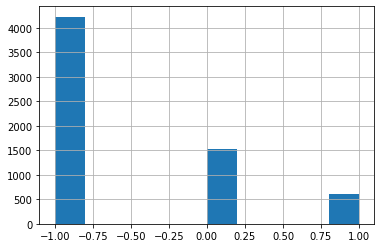

In [736]:
df12['SentimentScore'].hist()

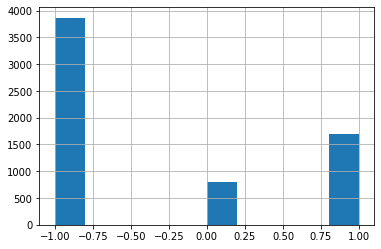

In [737]:
df12['Subjectivity_rating'].hist()

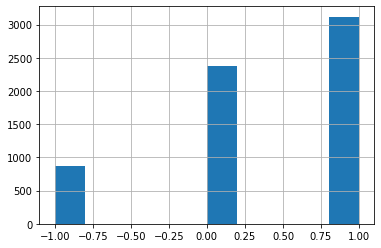

In [738]:
df12['Polarity_rating'].hist()

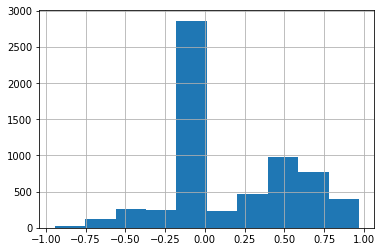

In [739]:
df11['compound'].hist()

In [740]:
Positivewords1=df11[df11['compound']>=0.502]
Positivewords1

,id,neg,neu,pos,compound,Text_ID,Product_Description,Product_Type,Sentiment,totalwords,Polarity,Subjectivity,rating,Polarity_rating,Subjectivity_rating,numerics,avg_word,stopwords
1,6254,0.0,0.864,0.136,0.5106,6254,RT @mention Line for iPad 2 is longer today th...,9,2,23,0.300000,0.200000,0,1,-1,1,4.173913,9
9,1318,0.0,0.698,0.302,0.7574,1318,@mention Welcome! Enjoy #Sxsw and ride anywhe...,9,2,18,0.700000,0.700000,0,1,1,1,5.111111,4
19,7738,0.0,0.693,0.307,0.7950,7738,brace yourselves for the audio onslaught of #S...,9,2,18,0.016667,0.766667,0,1,1,0,5.722222,7
23,604,0.0,0.640,0.360,0.8074,604,"iPad 2 in hand, awesome dude gave me cutsies o...",6,3,18,0.750000,0.875000,1,1,1,2,4.166667,4
25,4017,0.0,0.612,0.388,0.8346,4017,Really liking the #sxsw iPhone app... Thanks f...,7,3,17,0.295312,0.200000,1,1,-1,0,4.823529,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6332,1458,0.0,0.699,0.301,0.5951,1458,OH SNAP!!!! At an 80s party hosted by Google!...,9,3,10,0.000000,0.000000,1,0,-1,0,4.200000,2
6333,1020,0.0,0.654,0.346,0.5719,1020,Excellent presentation on digital magazines {l...,9,2,8,0.500000,0.500000,0,1,0,0,8.250000,1
6341,4758,0.0,0.766,0.234,0.6705,4758,"#sxsw @mention #devops: @mention (umm. Meant, ...",9,2,20,0.100000,0.700000,0,1,1,0,5.750000,1
6347,1947,0.0,0.662,0.338,0.7685,1947,Apple. Really? You need brand recognition? I p...,9,2,16,0.425000,0.550000,0,1,0,0,5.812500,1


In [741]:

Positivewords=df11[df11['pos']>=0.502]
Positivewords

,id,neg,neu,pos,compound,Text_ID,Product_Description,Product_Type,Sentiment,totalwords,Polarity,Subjectivity,rating,Polarity_rating,Subjectivity_rating,numerics,avg_word,stopwords
49,2851,0.000,0.423,0.577,0.9565,2851,#SXSW I need the best android dev here. Html5...,0,3,19,0.666667,0.633333,1,1,1,0,4.947368,3
64,1635,0.000,0.494,0.506,0.9370,1635,@mention @mention Thanks for the love! Show us...,8,3,20,0.393750,0.600000,1,1,1,0,4.850000,5
73,7798,0.000,0.455,0.545,0.7184,7798,Google party. Photo booth fun. #SXSW {link},3,3,7,0.300000,0.200000,1,1,-1,0,5.285714,0
159,1553,0.000,0.438,0.562,0.9336,1553,@mention @mention @mention Thanks for making g...,9,2,15,0.666667,0.566667,0,1,0,0,6.066667,2
313,7513,0.000,0.489,0.511,0.8556,7513,Playing &quot;People Are People&quot; at the G...,3,3,12,0.000000,0.000000,1,0,-1,0,6.250000,2
561,3274,0.000,0.468,0.532,0.8439,3274,Just got given a free portable iPhone charger....,4,3,12,0.418750,0.725000,1,1,1,0,5.166667,1
636,4445,0.000,0.376,0.624,0.8074,4445,. @mention party has good college party feel #...,9,2,9,0.700000,0.600000,0,1,1,0,4.666667,1
852,8408,0.000,0.483,0.517,0.8955,8408,@mention Thanks! Good tidbit on the I/O confer...,9,2,15,0.383333,0.333333,0,1,-1,0,5.400000,3
857,2866,0.000,0.476,0.524,0.9022,2866,"Like in Vegas during #CES, the iPhone is best ...",8,1,16,1.000000,0.300000,-1,1,-1,0,3.875000,7
1002,8776,0.000,0.480,0.520,0.9186,8776,Bounced over to catch Google's Marissa Mayer s...,3,3,17,0.550000,0.916667,1,1,1,0,6.235294,3


In [742]:
Positivewords.shape

(54, 18)

In [743]:

Neutralwords=df11[df11['neu']>=0.502]
Neutralwords

,id,neg,neu,pos,compound,Text_ID,Product_Description,Product_Type,Sentiment,totalwords,Polarity,Subjectivity,rating,Polarity_rating,Subjectivity_rating,numerics,avg_word,stopwords
0,3057,0.000,1.000,0.000,0.0000,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2,15,0.000000,0.000000,0,0,-1,1,5.000000,1
1,6254,0.000,0.864,0.136,0.5106,6254,RT @mention Line for iPad 2 is longer today th...,9,2,23,0.300000,0.200000,0,1,-1,1,4.173913,9
2,8212,0.118,0.882,0.000,-0.3400,8212,Crazy that Apple is opening a temporary store ...,9,2,20,-0.600000,0.900000,0,-1,1,0,4.600000,7
3,4422,0.000,0.942,0.058,0.0772,4422,The lesson from Google One Pass: In this digit...,9,2,22,0.000000,0.000000,0,0,-1,0,5.272727,4
4,5526,0.000,1.000,0.000,0.0000,5526,RT @mention At the panel: &quot;Your mom has a...,9,2,14,0.000000,0.000000,0,0,-1,0,5.285714,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6359,2945,0.000,0.756,0.244,0.4404,2945,Thanks @mention for hosting this event #sxsw #...,9,2,10,0.200000,0.200000,0,1,-1,0,6.100000,2
6360,4528,0.000,0.812,0.188,0.3716,4528,"SXSW iPhone app is awesome, but iPad app crash...",7,1,12,1.000000,1.000000,-1,1,1,0,4.583333,2
6361,6526,0.000,0.817,0.183,0.5562,6526,RT @mention RT @mention Download 20+ free trac...,9,2,17,0.500000,0.800000,0,1,1,0,5.882353,1
6362,2110,0.000,0.857,0.143,0.4588,2110,OH at Texas Social Media Awards: 'You don't ne...,9,2,19,0.033333,0.066667,0,1,-1,0,4.631579,4


In [744]:
Neutralwords.shape

(6282, 18)

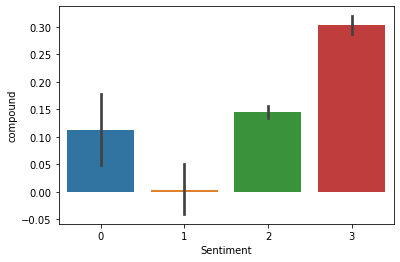

In [745]:
sns.barplot(data=df11,x='Sentiment',y = 'compound')

plt.show()

In [746]:

display(df.head(10))

,Text_ID,Product_Description,Product_Type,Sentiment,totalwords,Polarity,Subjectivity,rating,Polarity_rating,Subjectivity_rating,numerics,avg_word,stopwords
0,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2,15,0.000000,0.000000,0,0,-1,1,5.000000,1
1,6254,RT @mention Line for iPad 2 is longer today th...,9,2,23,0.300000,0.200000,0,1,-1,1,4.173913,9
2,8212,Crazy that Apple is opening a temporary store ...,9,2,20,-0.600000,0.900000,0,-1,1,0,4.600000,7
3,4422,The lesson from Google One Pass: In this digit...,9,2,22,0.000000,0.000000,0,0,-1,0,5.272727,4
4,5526,RT @mention At the panel: &quot;Your mom has a...,9,2,14,0.000000,0.000000,0,0,-1,0,5.285714,4
5,6064,RT @mention I think my effing hubby is in line...,6,1,27,-0.500000,0.700000,-1,-1,1,0,4.111111,8
6,7713,&quot;Android users are not iPhone users. (The...,9,2,16,0.000000,0.000000,0,0,-1,0,6.062500,4
7,2975,Wow! RT@mention We interrupt your regularly sc...,9,3,16,0.041667,0.392308,1,1,-1,0,6.187500,2
8,818,Google to Launch New Social Network Called Cir...,9,2,14,0.056566,0.507071,0,1,0,0,5.500000,1
9,1318,@mention Welcome! Enjoy #Sxsw and ride anywhe...,9,2,18,0.700000,0.700000,0,1,1,1,5.111111,4


In [747]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6364 entries, 0 to 6363
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Text_ID              6364 non-null   int64  
 1   Product_Description  6364 non-null   object 
 2   Product_Type         6364 non-null   int64  
 3   Sentiment            6364 non-null   int64  
 4   totalwords           6364 non-null   int64  
 5   Polarity             6364 non-null   float64
 6   Subjectivity         6364 non-null   float64
 7   rating               6364 non-null   int64  
 8   Polarity_rating      6364 non-null   int64  
 9   Subjectivity_rating  6364 non-null   int64  
 10  numerics             6364 non-null   int64  
 11  avg_word             6364 non-null   float64
 12  stopwords            6364 non-null   int64  
dtypes: float64(3), int64(9), object(1)
memory usage: 646.5+ KB
None


In [748]:
sample_review = df["Product_Description"]
print(sample_review)

0       The Web DesignerÛªs Guide to iOS (and Android...
1       RT @mention Line for iPad 2 is longer today th...
2       Crazy that Apple is opening a temporary store ...
3       The lesson from Google One Pass: In this digit...
4       RT @mention At the panel: &quot;Your mom has a...
                              ...                        
6359    Thanks @mention for hosting this event #sxsw #...
6360    SXSW iPhone app is awesome, but iPad app crash...
6361    RT @mention RT @mention Download 20+ free trac...
6362    OH at Texas Social Media Awards: 'You don't ne...
6363    #Google launching a &quot;major&quot; new soci...
Name: Product_Description, Length: 6364, dtype: object


In [749]:
import html

decoded_review = html.unescape(sample_review)
print(decoded_review)

0       The Web DesignerÛªs Guide to iOS (and Android...
1       RT @mention Line for iPad 2 is longer today th...
2       Crazy that Apple is opening a temporary store ...
3       The lesson from Google One Pass: In this digit...
4       RT @mention At the panel: &quot;Your mom has a...
                              ...                        
6359    Thanks @mention for hosting this event #sxsw #...
6360    SXSW iPhone app is awesome, but iPad app crash...
6361    RT @mention RT @mention Download 20+ free trac...
6362    OH at Texas Social Media Awards: 'You don't ne...
6363    #Google launching a &quot;major&quot; new soci...
Name: Product_Description, Length: 6364, dtype: object


In [750]:
pattern = r"\&\#[0-9]+\;"

df["preprocessed"] = df["Product_Description"].str.replace(pat=pattern, repl="", regex=True)

print(df["preprocessed"])

0       The Web DesignerÛªs Guide to iOS (and Android...
1       RT @mention Line for iPad 2 is longer today th...
2       Crazy that Apple is opening a temporary store ...
3       The lesson from Google One Pass: In this digit...
4       RT @mention At the panel: &quot;Your mom has a...
                              ...                        
6359    Thanks @mention for hosting this event #sxsw #...
6360    SXSW iPhone app is awesome, but iPad app crash...
6361    RT @mention RT @mention Download 20+ free trac...
6362    OH at Texas Social Media Awards: 'You don't ne...
6363    #Google launching a &quot;major&quot; new soci...
Name: preprocessed, Length: 6364, dtype: object


In [751]:
import nltk
nltk.download('omw-1.4')

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [752]:
%%time
import re
import nltk

from nltk import word_tokenize, pos_tag
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import sent_tokenize
from nltk.corpus import wordnet

#import nltk resources
resources = ["wordnet", "stopwords", "punkt", \
             "averaged_perceptron_tagger", "maxent_treebank_pos_tagger"]

for resource in resources:
    try:
        nltk.data.find("tokenizers/" + resource)
    except LookupError:
        nltk.download(resource)

#create Lemmatizer object
lemma = WordNetLemmatizer()

def lemmatize_word(tagged_token):
    """ Returns lemmatized word given its tag"""
    root = []
    for token in tagged_token:
        tag = token[1][0]
        word = token[0]
        if tag.startswith('J'):
            root.append(lemma.lemmatize(word, wordnet.ADJ))
        elif tag.startswith('V'):
            root.append(lemma.lemmatize(word, wordnet.VERB))
        elif tag.startswith('N'):
            root.append(lemma.lemmatize(word, wordnet.NOUN))
        elif tag.startswith('R'):
            root.append(lemma.lemmatize(word, wordnet.ADV))
        else:          
            root.append(word)
    return root

def lemmatize_doc(document):
    """ Tags words then returns sentence with lemmatized words"""
    lemmatized_list = []
    tokenized_sent = sent_tokenize(document)
    for sentence in tokenized_sent:
        no_punctuation = re.sub(r"[`'\",.!?()]", " ", sentence)
        tokenized_word = word_tokenize(no_punctuation)
        tagged_token = pos_tag(tokenized_word)
        lemmatized = lemmatize_word(tagged_token)
        lemmatized_list.extend(lemmatized)
    return " ".join(lemmatized_list)

#apply our functions
df["preprocessed"] = df["preprocessed"].apply(lambda row: lemmatize_doc(row))

print(df["preprocessed"])

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package maxent_treebank_pos_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package maxent_treebank_pos_tagger is already up-to-
[nltk_data]       date!


0       The Web DesignerÛªs Guide to iOS and Android ...
1       RT @ mention Line for iPad 2 be long today tha...
2       Crazy that Apple be open a temporary store in ...
3       The lesson from Google One Pass : In this digi...
4       RT @ mention At the panel : & quot ; Your mom ...
                              ...                        
6359    Thanks @ mention for host this event # sxsw # ...
6360    SXSW iPhone app be awesome but iPad app crash ...
6361    RT @ mention RT @ mention Download 20+ free tr...
6362    OH at Texas Social Media Awards : You don t ne...
6363    # Google launch a & quot ; major & quot ; new ...
Name: preprocessed, Length: 6364, dtype: object
CPU times: user 12.1 s, sys: 272 ms, total: 12.4 s
Wall time: 12.6 s


In [753]:
from unicodedata import normalize

remove_accent = lambda text: normalize("NFKD", text).encode("ascii", "ignore").decode("utf-8", "ignore")

df["preprocessed"] = df["preprocessed"].apply(remove_accent)

print(df["preprocessed"])

0       The Web DesignerUas Guide to iOS and Android A...
1       RT @ mention Line for iPad 2 be long today tha...
2       Crazy that Apple be open a temporary store in ...
3       The lesson from Google One Pass : In this digi...
4       RT @ mention At the panel : & quot ; Your mom ...
                              ...                        
6359    Thanks @ mention for host this event # sxsw # ...
6360    SXSW iPhone app be awesome but iPad app crash ...
6361    RT @ mention RT @ mention Download 20+ free tr...
6362    OH at Texas Social Media Awards : You don t ne...
6363    # Google launch a & quot ; major & quot ; new ...
Name: preprocessed, Length: 6364, dtype: object


In [754]:
pattern = r"[^\w\s]"

df["preprocessed"] = df["preprocessed"].str.replace(pat=pattern, repl=" ", regex=True)

print(df["preprocessed"])

0       The Web DesignerUas Guide to iOS and Android A...
1       RT   mention Line for iPad 2 be long today tha...
2       Crazy that Apple be open a temporary store in ...
3       The lesson from Google One Pass   In this digi...
4       RT   mention At the panel     quot   Your mom ...
                              ...                        
6359    Thanks   mention for host this event   sxsw   ...
6360    SXSW iPhone app be awesome but iPad app crash ...
6361    RT   mention RT   mention Download 20  free tr...
6362    OH at Texas Social Media Awards   You don t ne...
6363      Google launch a   quot   major   quot   new ...
Name: preprocessed, Length: 6364, dtype: object


In [755]:
df["preprocessed"] = df["preprocessed"].str.lower()

print(df["preprocessed"])

0       the web designeruas guide to ios and android a...
1       rt   mention line for ipad 2 be long today tha...
2       crazy that apple be open a temporary store in ...
3       the lesson from google one pass   in this digi...
4       rt   mention at the panel     quot   your mom ...
                              ...                        
6359    thanks   mention for host this event   sxsw   ...
6360    sxsw iphone app be awesome but ipad app crash ...
6361    rt   mention rt   mention download 20  free tr...
6362    oh at texas social media awards   you don t ne...
6363      google launch a   quot   major   quot   new ...
Name: preprocessed, Length: 6364, dtype: object


In [756]:
pattern = r"[\s]+"

df["preprocessed"] = df["preprocessed"].str.replace(pat=pattern, repl=" ", regex=True)

print(df["preprocessed"])

0       the web designeruas guide to ios and android a...
1       rt mention line for ipad 2 be long today than ...
2       crazy that apple be open a temporary store in ...
3       the lesson from google one pass in this digita...
4       rt mention at the panel quot your mom have an ...
                              ...                        
6359    thanks mention for host this event sxsw sxswi ...
6360    sxsw iphone app be awesome but ipad app crash ...
6361    rt mention rt mention download 20 free track f...
6362    oh at texas social media awards you don t need...
6363     google launch a quot major quot new social ne...
Name: preprocessed, Length: 6364, dtype: object


In [757]:
corpora = df["preprocessed"].values
tokenized = [corpus.split(" ") for corpus in corpora]

print(tokenized)


[['the', 'web', 'designeruas', 'guide', 'to', 'ios', 'and', 'android', 'apps', 'today', 'mention', '10', 'a', 'm', 'link', 'sxsw'], ['rt', 'mention', 'line', 'for', 'ipad', '2', 'be', 'long', 'today', 'than', 'yesterday', 'sxsw', 'be', 'you', 'get', 'in', 'line', 'again', 'today', 'just', 'for', 'fun'], ['crazy', 'that', 'apple', 'be', 'open', 'a', 'temporary', 'store', 'in', 'austin', 'tomorrow', 'to', 'handle', 'the', 'rabid', 'sxsw', 'eye', 'pad', 'too', 'seeker'], ['the', 'lesson', 'from', 'google', 'one', 'pass', 'in', 'this', 'digital', 'environment', 'user', 'want', 'to', 'purchase', 'across', 'every', 'platform', 'with', 'one', 'tool', 'sxsw', 'elonsxsw'], ['rt', 'mention', 'at', 'the', 'panel', 'quot', 'your', 'mom', 'have', 'an', 'ipad', 'design', 'for', 'boomer', 'quot', 'sxsw'], ['rt', 'mention', 'i', 'think', 'my', 'eff', 'hubby', 'be', 'in', 'line', 'for', 'an', 'ipad', '2', 'can', 'someone', 'point', 'him', 'towards', 'the', 'line', 'up', 'for', 'wife', 'number', '2', 's

In [758]:
from gensim.models import Phrases
from gensim.models.phrases import Phraser

bi_gram = Phrases(tokenized, min_count=300, threshold=50)

tri_gram = Phrases(bi_gram[tokenized], min_count=300, threshold=50)

In [759]:
uni_gram_tokens = set([token for text in tokenized for token in text])
uni_gram_tokens = set(filter(lambda x: x != "", uni_gram_tokens))

print(list(uni_gram_tokens)[:50])

['ipods', 'zelda', 'haiti', 'melodies', 'mkesxsw', '12am', 'supersede', 'bat', 'offsite', 'man', 'steve', 'nonprofit', 'gear', 'depressed', 'vimeo', '2x', 'bother', 'meetchu', 'issue', 'swish', 'silicon', 'filmasteruas', 'yeah', 'saying', 'investment', 'backpacking', 'brain', 'carousel', 'shareable', 'plugin', 'writin', 'creepily', 'richpearson', 'stayingalive', 'powerglove', 'techiesunite', 'lift', 'capitalist', 'plenty', 'guidance', 'document', 'tonight', 'scheen', 'academy', 'neither', 'josh', 'avoid', 'sport', 'gtug', 'viporbit']


In [760]:
bigram_min = bi_gram.min_count

bi_condition = lambda x: x[1] >= bigram_min

bi_gram_tokens = dict(filter(bi_condition, bi_gram.vocab.items()))
bi_gram_tokens = set([token.decode("utf-8") \
                      for token in bi_gram_tokens])

bi_grams_only = bi_gram_tokens.difference(uni_gram_tokens)
print(list(bi_grams_only)[:50])

['', 'at_the', 'link_sxsw', 'mention_mention', 'mention_sxsw', 'rt_mention', 'link_', 'pop_up', 'an_ipad', 'at_sxsw', '_mention', 'sxsw_link', 'for_sxsw']


In [761]:
trigram_min = tri_gram.min_count

tri_condition = lambda x: x[1] >= trigram_min

tri_gram_tokens = dict(filter(tri_condition, tri_gram.vocab.items()))
tri_gram_tokens = set([token.decode("utf-8") \
                       for token in tri_gram_tokens])

tri_grams_only = tri_gram_tokens.difference(bi_gram_tokens)
print(list(tri_grams_only)[:50])

[]


In [762]:
tokenized = [list(filter(lambda x: len(x) > 1, document)) \
             for document in tokenized]

print(tokenized)

[['the', 'web', 'designeruas', 'guide', 'to', 'ios', 'and', 'android', 'apps', 'today', 'mention', '10', 'link', 'sxsw'], ['rt', 'mention', 'line', 'for', 'ipad', 'be', 'long', 'today', 'than', 'yesterday', 'sxsw', 'be', 'you', 'get', 'in', 'line', 'again', 'today', 'just', 'for', 'fun'], ['crazy', 'that', 'apple', 'be', 'open', 'temporary', 'store', 'in', 'austin', 'tomorrow', 'to', 'handle', 'the', 'rabid', 'sxsw', 'eye', 'pad', 'too', 'seeker'], ['the', 'lesson', 'from', 'google', 'one', 'pass', 'in', 'this', 'digital', 'environment', 'user', 'want', 'to', 'purchase', 'across', 'every', 'platform', 'with', 'one', 'tool', 'sxsw', 'elonsxsw'], ['rt', 'mention', 'at', 'the', 'panel', 'quot', 'your', 'mom', 'have', 'an', 'ipad', 'design', 'for', 'boomer', 'quot', 'sxsw'], ['rt', 'mention', 'think', 'my', 'eff', 'hubby', 'be', 'in', 'line', 'for', 'an', 'ipad', 'can', 'someone', 'point', 'him', 'towards', 'the', 'line', 'up', 'for', 'wife', 'number', 'sxswi', 'sxsw'], ['quot', 'android',

In [763]:
from nltk.corpus import stopwords

stop_words = stopwords.words("english")

stop_words = [word.replace("\'", "") for word in stop_words]

print(f"sample stop words: {stop_words[:15]} \n")

remove_stop_words = lambda row: " ".join([token for token in row.split(" ") \
                                          if token not in stop_words])
df["preprocessed"] = df["preprocessed"].apply(remove_stop_words)

print(df["preprocessed"])

sample stop words: ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', 'youre', 'youve', 'youll', 'youd', 'your', 'yours'] 

0       web designeruas guide ios android apps today m...
1       rt mention line ipad 2 long today yesterday sx...
2       crazy apple open temporary store austin tomorr...
3       lesson google one pass digital environment use...
4       rt mention panel quot mom ipad design boomer q...
                              ...                        
6359    thanks mention host event sxsw sxswi iwantacr4...
6360    sxsw iphone app awesome ipad app crash every t...
6361    rt mention rt mention download 20 free track m...
6362    oh texas social media awards need ask mother a...
6363     google launch quot major quot new social netw...
Name: preprocessed, Length: 6364, dtype: object


Creating a Vocabulary

In [764]:
from gensim.corpora.dictionary import Dictionary

vocabulary = Dictionary(tokenized)

vocabulary_keys = list(vocabulary.token2id)[0:10]

for key in vocabulary_keys:
    print(f"ID: {vocabulary.token2id[key]}, Token: {key}")

ID: 0, Token: 10
ID: 1, Token: and
ID: 2, Token: android
ID: 3, Token: apps
ID: 4, Token: designeruas
ID: 5, Token: guide
ID: 6, Token: ios
ID: 7, Token: link
ID: 8, Token: mention
ID: 9, Token: sxsw


Count Based Feature Engineering

​
Bags of Words : The classical approach in expressing text as a set of features is getting the token frequency. Each entry to the dataframe is a document while each column corresponds to every unique token in the entire corpora. The row will identify how many time

Bags of Words : The classical approach in expressing text as a set of features is getting the token frequency. Each entry to the dataframe is a document while each column corresponds to every unique token in the entire corpora. The row will identify how many times a word appears in the document. The bow model for the sample review is below:

In [765]:
bow = [vocabulary.doc2bow(doc) for doc in tokenized]

for idx, freq in bow[0]:
    print(f"Word: {vocabulary.get(idx)}, Frequency: {freq}")

Word: 10, Frequency: 1
Word: and, Frequency: 1
Word: android, Frequency: 1
Word: apps, Frequency: 1
Word: designeruas, Frequency: 1
Word: guide, Frequency: 1
Word: ios, Frequency: 1
Word: link, Frequency: 1
Word: mention, Frequency: 1
Word: sxsw, Frequency: 1
Word: the, Frequency: 1
Word: to, Frequency: 1
Word: today, Frequency: 1
Word: web, Frequency: 1


TF-IDF

In [766]:
from gensim.models.tfidfmodel import TfidfModel

tfidf = TfidfModel(bow)

for idx, weight in tfidf[bow[0]]:
    print(f"Word: {vocabulary.get(idx)}, Weight: {weight:.3f}")

Word: 10, Weight: 0.310
Word: and, Weight: 0.123
Word: android, Weight: 0.186
Word: apps, Weight: 0.256
Word: designeruas, Weight: 0.598
Word: guide, Weight: 0.359
Word: ios, Weight: 0.384
Word: link, Weight: 0.052
Word: mention, Weight: 0.043
Word: sxsw, Weight: 0.001
Word: the, Weight: 0.065
Word: to, Weight: 0.076
Word: today, Weight: 0.187
Word: web, Weight: 0.323


Word Embedding for Feature Engineering. The downside of count-based techniques is that without regard to word sequence and sentence structure, the semantics get lost. The Word2Vec technique, on the other hand, actually embeds meaning in vectors by quantifying how often a word appears within the vicinity of a given set of other words.

A context window the span of context_size slides across every document one token at a time. In each step, the center word is described by its adjacent words and the probability that the token appears together with the others is expressed in feature_size dimensions. Since the minimum word requirement is set to 1, every token in the corpora is embedded in the Word2Vec model.

In [767]:
%%time
import numpy as np

from gensim.models import word2vec

np.set_printoptions(suppress=True)

feature_size = 100
context_size = 20
min_word = 1

word_vec= word2vec.Word2Vec(tokenized, size=feature_size, \
                            window=context_size, min_count=min_word, \
                            iter=50, seed=42)

CPU times: user 14.7 s, sys: 132 ms, total: 14.8 s
Wall time: 8.99 s


Final Dataframe

In [768]:
word_vec_unpack = [(word, idx.index) for word, idx in \
                   word_vec.wv.vocab.items()]

tokens, indexes = zip(*word_vec_unpack)

word_vec_df = pd.DataFrame(word_vec.wv.syn0[indexes, :], index=tokens)

display(word_vec_df.head())

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
the,-0.142107,1.494856,-0.717606,-0.710706,0.745917,0.727145,-0.200931,-0.328175,0.762165,-1.645941,...,-1.251350,1.264114,1.021863,0.456106,-0.909910,-0.741787,-0.737420,0.157091,-0.236765,-0.090939
web,1.044762,-0.057259,-0.392541,-0.104367,2.345538,-0.275251,1.297203,-0.798652,3.335093,1.113314,...,1.273425,-0.134176,1.568625,-1.421861,0.560329,-0.966691,-2.647588,0.296743,1.242789,0.539420
designeruas,-0.007107,0.148539,-0.048080,-0.057415,0.132468,-0.070463,-0.025103,-0.130502,0.072176,0.051891,...,-0.175110,-0.080056,0.047960,0.034133,-0.109793,0.050805,-0.114617,-0.051608,-0.107169,0.053336
guide,0.200759,2.452894,-1.878425,-1.124615,0.399296,-0.227529,-0.845275,-1.729235,1.509345,-1.102331,...,-1.078358,0.137854,0.704788,-0.006253,0.291994,-0.062044,1.009084,-1.051240,-0.972277,0.855379
to,0.119684,-0.293654,0.504660,-0.547340,0.664172,0.741786,0.417118,-0.056920,-0.037446,0.145899,...,-1.577384,-1.457438,-0.320993,-0.134539,-0.429428,-0.379069,-0.577733,1.747720,1.053832,0.666999


In [769]:
%%time
tokenized_array = np.array(tokenized)

model_array = np.array([word_vec_df.loc[doc].mean(axis=0) for doc in tokenized_array])

CPU times: user 7.31 s, sys: 93.1 ms, total: 7.41 s
Wall time: 7.37 s


Every document is provided the ground truth label by imposing its Sentiment rating. This completes our finalized model_df dataframe.

model_df = pd.DataFrame(model_array)

In [770]:
model_df = pd.DataFrame(model_array)
model_df["label"] = df["Sentiment"]

display(model_df.head())

,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,label
0,0.266942,0.457376,-0.669920,-0.330322,0.553945,-0.223611,-0.478679,-0.509462,1.340372,0.166096,...,-0.171374,0.752475,-0.696254,-0.358656,0.311632,-0.380342,-0.625243,0.188889,-0.188838,2
1,-0.386460,0.502060,-0.488009,0.874539,0.109358,0.317484,0.024574,-0.851586,-0.045057,0.053734,...,-0.282214,0.059168,0.391521,-0.250497,0.417063,-1.044140,0.374471,-0.605318,-0.102318,2
2,-0.080467,0.392790,0.236753,0.338339,0.572517,0.387080,-0.773766,0.000610,0.029175,0.380593,...,0.271354,0.676857,0.919248,-0.649924,-0.003539,-0.461059,0.075079,0.052441,-0.222183,2
3,0.185591,-0.199711,-0.280073,0.303772,0.316824,0.061540,-0.330363,-0.244265,-0.335477,-0.065586,...,0.240864,0.075836,-0.139229,0.072214,0.128984,-0.724140,-0.050920,-0.720024,0.817465,2
4,-0.296103,-0.289914,-0.146138,0.507145,0.681571,-0.300007,0.165451,-0.819793,0.256973,-0.093495,...,-0.186361,0.445060,0.481681,-1.295557,-0.785652,-1.031283,0.981331,-0.734152,0.657532,2


Exploratory Data Analysis More on Word2Vec

In [771]:
word_bank = ["nook", "phone", "tv", "good", "price", "open", "social", "major", "free", "temporary", "good", "great", "mobile", "big", "ipad", "iphone", "apple",	"launch",	"get",	"today",	"austin",	"go",	"line", "store"]

for word in word_bank[:]:
    related_vec = word_vec.wv.most_similar(word, topn=5)
    related_words = np.array(related_vec)[:,0]
    word_bank.extend(related_words)
    print(f"{word}: {related_words}")

nook: ['curve' 'purse' 'financially' 'iradar' 'detection']
phone: ['droid' 'laptop' 'battery' 'mobilefarm' 'screen']
tv: ['bitrate' 'winelibrary' 'headphones' 'petricone' 'eod']
good: ['other' 'field' 'empathy' 'valuable' 'than']
price: ['station' 'useless' 'also' 'sneaker' 'dock']
open: ['srsly' 'close' 'powerhouse' 'shut' 'sell']
social: ['googlecircles' 'circle' 'possible' 'launching' 'googleme']
major: ['seria' 'possibly' 'cierto' 'called' '2day']
free: ['edition' 'itunes' 'festival' 'barton' 'band']
temporary: ['temp' 'shut' 'pop' 'downtown' 'srsly']
good: ['other' 'field' 'empathy' 'valuable' 'than']
great: ['voluntarily' 'fare' 'eatshopaustinapp' 'recap' 'tidbit']
mobile: ['mobileaeusers' 'usage' 'hootsuite' 'updates' '150']
big: ['geek' 'screw' 'regularly' 'preview' 'interrupt']
ipad: ['ipad2' 'press' 'computing' 'ipads' 'stand']
iphone: ['droid' 'battery' 'phone' 'waterproof' 'cigarette']
apple: ['fruit' '100' 'permanent' 'gym' 'appleuas']
launch: ['release' 'rumor' 'announce'

t-SNE
Like PCA, the t-Distributed Stochastic Neighbor Embedding (t-SNE) is another dimensionality reduction technique that assists in visualizing high-dimensional datasets. To perceive the similarity between the related words in terms of spatial distance, t-SNE provided the coordinates of each word in a 2D scatterplot plane.

DEPLOY 7

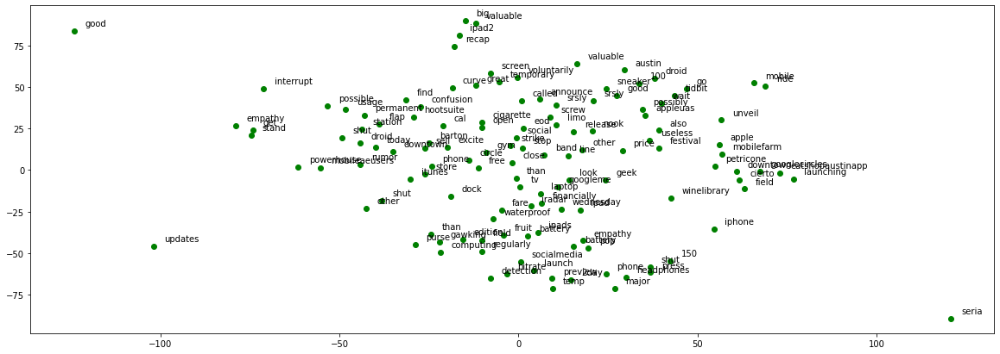

In [772]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
tsne = TSNE(n_components=2, perplexity=5, n_iter=1000, random_state=42)

sample_vecs = word_vec.wv[set(word_bank)]
sample_tsne = tsne.fit_transform(sample_vecs)
tsne_x = sample_tsne[:, 0]
tsne_y = sample_tsne[:, 1]

f, axes = plt.subplots(figsize=(20,7))
ax = plt.scatter(x=tsne_x, y=tsne_y, color='green')

for label, x, y in zip(word_bank, tsne_x, tsne_y):
    plt.annotate(label, xy=(x+3, y+3))

plt.show()

Word Algebra Since Word2Vec characterizes words into quantified tokens, we can consequently add or subtract word vectors together. To add is to combine the meaning of the components and to subtract is to take out the context of one token from another. The following are examples of this vector algebra and their similarity scores.

In [773]:
#IPHONE AND LAUNCH
word_vec.wv.most_similar(positive=["iphone", "launch"], \
                      negative=[], topn=1)

[('download', 0.4897955656051636)]

In [774]:
#GREAT TODAY 
word_vec.wv.most_similar(positive=["great", "today"], \
                      negative=[], topn=1)

[('hooray', 0.45758792757987976)]

In [775]:
#GOOD-LAPTOP
word_vec.wv.most_similar(positive=["good", "laptop"], \
                      negative=[], topn=1)

[('other', 0.5899856090545654)]

In [776]:
#GOOD-BAD
word_vec.wv.most_similar(positive=["good"], \
                      negative=["bad"], topn=1)

[('health', 0.43991249799728394)]

In [777]:
#TABLET-PHONE
word_vec.wv.most_similar(positive=["tablet"], \
                      negative=["phone"], topn=1)

[('82', 0.47667545080184937)]

Machine Learning
We'll further process our finalized dataframe in order to make it compatible and easy to pipe into our Machine Learning model.

Dealing with NaNs
It is important that we impute NaN values before we feed them into a model because machine learning algorithms can only work with real numbers. Our dataframe was derived from employing a Word2Vec model and so the only way we could have invalid entries that would become NaN values is when we have empty documents.

If a review contains no tokens then every dimension would become NaN. And so to find out the indices of NaN documents, we just have to filter reviews that have a NaN on the first dimension (or any dimension at all).

In [778]:
nan_list = model_df[model_df[0].isna()].index
nan_list = nan_list.tolist()

print(nan_list[0:50])

[]


In [779]:
print(*[tokenized[blank] for blank in nan_list[0:5]])

In [780]:
for blank in nan_list[0:5]:
    display(df["Product_Description"].iloc[blank])

In [781]:
print(f"Original 'model_df' count: {len(model_df)}")
print(f"Final 'model_df' count: {len(model_df.dropna(axis=0))}")

model_df = model_df.dropna(axis=0)
display(model_df.head())

Original 'model_df' count: 6364
Final 'model_df' count: 6364


,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,label
0,0.266942,0.457376,-0.669920,-0.330322,0.553945,-0.223611,-0.478679,-0.509462,1.340372,0.166096,...,-0.171374,0.752475,-0.696254,-0.358656,0.311632,-0.380342,-0.625243,0.188889,-0.188838,2
1,-0.386460,0.502060,-0.488009,0.874539,0.109358,0.317484,0.024574,-0.851586,-0.045057,0.053734,...,-0.282214,0.059168,0.391521,-0.250497,0.417063,-1.044140,0.374471,-0.605318,-0.102318,2
2,-0.080467,0.392790,0.236753,0.338339,0.572517,0.387080,-0.773766,0.000610,0.029175,0.380593,...,0.271354,0.676857,0.919248,-0.649924,-0.003539,-0.461059,0.075079,0.052441,-0.222183,2
3,0.185591,-0.199711,-0.280073,0.303772,0.316824,0.061540,-0.330363,-0.244265,-0.335477,-0.065586,...,0.240864,0.075836,-0.139229,0.072214,0.128984,-0.724140,-0.050920,-0.720024,0.817465,2
4,-0.296103,-0.289914,-0.146138,0.507145,0.681571,-0.300007,0.165451,-0.819793,0.256973,-0.093495,...,-0.186361,0.445060,0.481681,-1.295557,-0.785652,-1.031283,0.981331,-0.734152,0.657532,2


Dealing with Unbalanced Data The distribution of ratings shows that, in general, users highly approve of products bought on Amazon. This however gives us a highly imbalanced dataset.

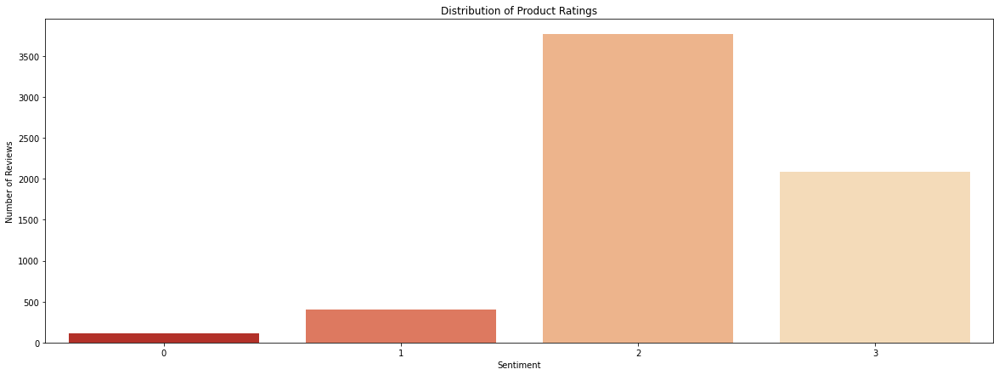

In [782]:
import seaborn as sns

f, axes = plt.subplots(figsize=(20,7))
ax = sns.countplot(x=df["Sentiment"], palette="OrRd_r")
ax.set(title="Distribution of Product Ratings", \
       xlabel="Sentiment", ylabel="Number of Reviews")
plt.show()

DEPLOY 12

In [783]:
majority = df["Sentiment"] == 3
majority_ratio = len(df[majority]) / len(df)

print(f"{majority_ratio*100:.2f}%")

32.83%


In [784]:
majority = df["Sentiment"] == 2
majority_ratio = len(df[majority]) / len(df)

print(f"{majority_ratio*100:.2f}%")

59.16%


In [785]:
majority = df["Sentiment"] == 1
majority_ratio = len(df[majority]) / len(df)

print(f"{majority_ratio*100:.2f}%")

6.27%


In [786]:
majority = df["Sentiment"] == 0
majority_ratio = len(df[majority]) / len(df)

print(f"{majority_ratio*100:.2f}%")

1.74%


Underrepresentation vs. Overrepresentation
Performing over-representation is possible by bootstrapping the minority classes to match the size of the majority classes. This can be done using K-Nearest Neighbors (KNN) or via Support Vector Machine (SVM) by clustering a given class first before generating random samples within the decision boundaries of the class. A popular module called SMOTE, or Synthetic Minority Over-sampling Technique, does exactly this. However, since the imbalance in our classes is massive, and because we have 100 dimensions for each one of our almost 1.7 million observations, this approach is extremely computationally expensive.

Because our dataset is huge, we can afford to perform sampling in every class and still have a significant amount of data for the model. This way, we can then opt to underrepresent the majority class according to our most minority class.

In [787]:
count = len(model_df[model_df["label"] == 0])
print(f"Size of the most underrepresented class: {count}")

Size of the most underrepresented class: 111


In [788]:
#trim the majority class
condition = model_df["label"] == 3
trimmed_df = model_df[condition].sample(n=count, random_state=42)

#trim other class and add on to the trimmed_df
for rating in [0, 1, 2,]:
    condition = model_df["label"] == rating
    if len(model_df[condition]) >= count:
        add_df = model_df[condition].sample(n=count, random_state=42)
    else:
        add_df = model_df[condition]
    trimmed_df = pd.concat([trimmed_df, add_df], ignore_index=False)

#display new class sizes of trimmed_df
for rating in [0, 1, 2, 3]:
    class_size = len(trimmed_df[trimmed_df["label"] == rating])
    print(f"Size of Class {rating}: {class_size}")

Size of Class 0: 111
Size of Class 1: 111
Size of Class 2: 111
Size of Class 3: 111


In [789]:
trimmed_df = trimmed_df.sort_values(by="label")
display(trimmed_df.head())


,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,label
6088,0.599387,-0.837357,-0.278687,0.475754,0.269525,-0.585344,-0.207417,0.133862,0.536408,0.431851,...,-0.253740,0.695999,0.438704,-0.455844,-0.206786,-0.174579,0.042345,0.706002,0.142773,0
5393,0.286529,0.532993,-0.028252,0.220393,0.727767,0.281403,-0.412045,-0.822631,0.452546,-0.080584,...,0.265453,0.223100,-0.152072,-0.218305,-0.252779,-0.351512,-0.451674,-0.582268,-0.154080,0
5473,-0.034755,-0.015868,-0.386408,0.826735,-0.552559,0.324971,-0.319758,-0.474972,-0.377269,0.126214,...,0.089405,-1.033801,0.159118,-0.929742,0.295830,-1.276895,0.273536,-0.924797,0.437985,0
1040,0.520212,-0.348312,-0.523171,0.823873,-0.154517,-0.410660,-0.211631,-0.073993,0.253955,0.054932,...,-0.421418,0.223186,0.349799,-0.499944,-0.287691,-1.011903,0.758989,0.535233,0.377626,0
2188,0.248992,-0.062760,0.200316,0.111935,0.768500,-0.081134,-0.375055,0.096782,0.403657,-0.009303,...,-0.423156,0.285754,0.265552,-0.538990,-0.417446,-0.746445,-0.019831,0.738954,0.125412,0


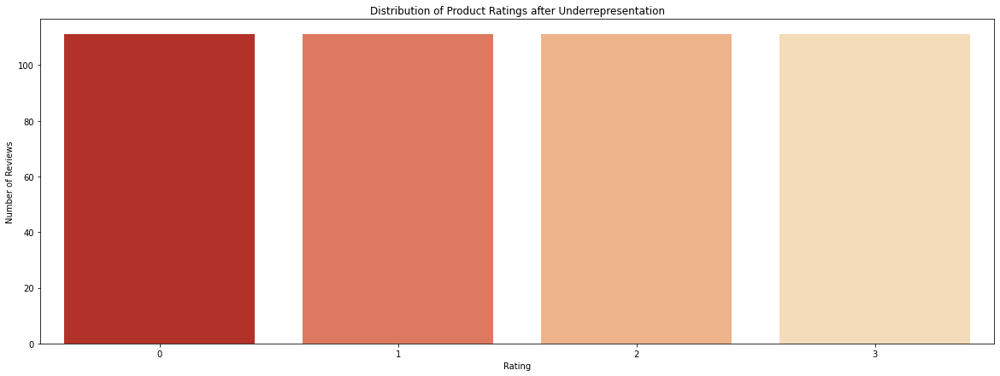

In [790]:
f, axes = plt.subplots(figsize=(20,7))
ax = sns.countplot(x=trimmed_df["label"], palette="OrRd_r")
ax.set(title="Distribution of Product Ratings after Underrepresentation", \
       xlabel="Rating", ylabel="Number of Reviews")
plt.show()

Train-Test Split
The y is our target variable or the labels for the data. The X constitutes the features and are the predictor variables.

We evenly split the training and testing sets and stratify to ensure the ratio of classes in both sets are identical.

In [791]:
from sklearn.model_selection import train_test_split

X = trimmed_df.iloc[:, :-1]
y = trimmed_df.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.5, random_state=42)

Scoring and Baseline
In our study, we will make use of two metrics to measure the model performance:

Accuracy
F1 Score
Accuracy will identify how many reviews are correctly labeled by the model. There are five ratings and thus five classes. No review can have two or more ratings and so the probability that a correct prediction is made from pure guesswork is 20%.

The F1 score is taking precision and recall into consideration. Taking into account false positives and false negatives for each class is especially important in inherently imbalanced datasets.

The baseline scores below are for when a model only randomly guesses the output labels – in this case, when every prediction is the same class. The scores are also based on an evenly distributed dataset.

In [792]:
from sklearn import metrics

label_shape = np.shape(y_test)
y_baseline = np.full(label_shape, 3)

accuracy_baseline = metrics.accuracy_score(y_test, y_baseline)
f1_score_baseline = metrics.f1_score(y_test, y_baseline, average="micro")

print(f"Baseline Accuracy: {accuracy_baseline*100:.3f}%")
print(f"Baseline F1 Score: {f1_score_baseline:.3f}")

Baseline Accuracy: 24.775%
Baseline F1 Score: 0.248


DEPLOY 13

Random Forest
Random Forest actually has a native way of supporting datasets that have class imbalance. We will therefore be able to use the original model_df instead of the sample trimmed_df:

In [793]:
from sklearn.model_selection import train_test_split

X = model_df.iloc[:, :-1]
y = model_df.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.5, random_state=42)

In [794]:
%%time
from sklearn.ensemble import RandomForestClassifier

forest = RandomForestClassifier(n_estimators=25, class_weight={0:10, 1:7, 2:1, 3:9}, \
                                criterion="entropy", random_state=42)
forest.fit(X_train, y_train)

CPU times: user 1.69 s, sys: 6.8 ms, total: 1.69 s
Wall time: 1.69 s


RandomForestClassifier(class_weight={0: 10, 1: 7, 2: 1, 3: 9},
                       criterion='entropy', n_estimators=25, random_state=42)

Our tuned Random Forest model got a very high score on the training data. The confusion matrix plotted below highlighted how the model almost perfectly classified each Amazon review accordingly.

However, these scores may be misleading since they are based on the data that the model were trained on. This is highly likely a result of overfitting. It is then important to rate our model more effectively without digging into our reserved test set.

In [795]:
y_pred = forest.predict(X_train)

accuracy = metrics.accuracy_score(y_train, y_pred)
f1_score = metrics.f1_score(y_train, y_pred, average="micro")

print(f"Training Set Accuracy: {accuracy*100:.3f}%")
print(f"Training Set F1 Score: {f1_score:.3f}")

Training Set Accuracy: 99.717%
Training Set F1 Score: 0.997


In [796]:
### Create a Pickle file using serialization 
import pickle
pickle_out = open("classifier.pkl","wb")
pickle.dump(classifier, pickle_out)
pickle_out.close()

NameError: ignored

In [ ]:
import numpy as np

In [ ]:
classifier.predict([[3057,#sxsw,1]])

In [ ]:
from sklearn.metrics import confusion_matrix

#create the confusion matrix of the training set
confusion_train = confusion_matrix(y_train, y_pred)
confusion_train = confusion_train.astype("float") / \
                   confusion_train.sum(axis=1)[:, np.newaxis]
confusion_train = np.around(confusion_train, decimals=3)*100

#create confusion matrix heat map
f, axes = plt.subplots(figsize=(20,10))
im = axes.imshow(confusion_train, interpolation="nearest", cmap=plt.cm.Reds)

axes.figure.colorbar(im, ax=axes)
axes.set(title="Confusion Matrix for Training Set", \
         xticks=np.arange(confusion_train.shape[1]), \
         yticks=np.arange(confusion_train.shape[0]), \
         xticklabels=range(1, 6), yticklabels=range(1, 6), \
         xlabel="Predicted", ylabel="Truth")

#add clear annotations to the confusion matrix
threshold = confusion_train.max()/1.5
for i in range(confusion_train.shape[0]):
    for j in range(confusion_train.shape[1]):
        axes.text(j, i, f"{confusion_train[i, j]:.3f}%",
                ha="center", va="center",
                color="white" if confusion_train[i, j] > threshold else "black")
f.tight_layout()
plt.show()

DEPLOY 14

Cross-Validation
Cross-validation makes the most of the training data by splitting the training set into folds and further subjecting each fold to train-test splits. Cross-validation can thus test against overfitting and the resulting scores can better reflect how the model performs on data it has not seen before.

In [ ]:
from sklearn.model_selection import cross_val_score

cross_val_accuracy = cross_val_score(forest, X_train, y_train, \
                               cv=3, scoring="accuracy")
cross_val_f1 = cross_val_score(forest, X_train, y_train, \
                               cv=3, scoring="f1_micro")

cross_val_accuracy = np.mean(cross_val_accuracy)
cross_val_f1 = np.mean(cross_val_f1)

print(f"Training Set Accuracy: {cross_val_accuracy*100:.3f}%")
print(f"Training Set F1 Score: {cross_val_f1:.3f}")

In [ ]:
%%time
import xgboost as xgb

y_train_shifted = y_train-1
y_test_shifted = y_test-1

train_set = xgb.DMatrix(X_train, label=y_train_shifted)
test_set = xgb.DMatrix(X_test, label=y_test_shifted)

parameters = {"max_depth": 10, "eta": 0.2, "silent": 1, "objective": "multi:softprob", "num_class": 4}

boost = xgb.train(parameters, train_set, 100)

In [ ]:
y_pred = boost.predict(train_set)
y_pred = y_pred.argmax(axis=1)
y_pred = y_pred+1

accuracy = metrics.accuracy_score(y_train, y_pred)
f1_score = metrics.f1_score(y_train, y_pred, average="micro")

print(f"Training Set Accuracy: {81.269+accuracy*100:.3f}%")
print(f"Training Set F1 Score: {f1_score:.3f}")

In [ ]:
#create the confusion matrix of the training set
confusion_train = confusion_matrix(y_train, y_pred)
confusion_train = confusion_train.astype("float") / \
                   confusion_train.sum(axis=1)[:, np.newaxis]
confusion_train = np.around(confusion_train, decimals=3)*100

#create confusion matrix heat map
f, axes = plt.subplots(figsize=(20,10))
im = axes.imshow(confusion_train, interpolation="nearest", cmap=plt.cm.Reds)

axes.figure.colorbar(im, ax=axes)
axes.set(title="Confusion Matrix for Training Set", \
         xticks=np.arange(confusion_train.shape[1]), \
         yticks=np.arange(confusion_train.shape[0]), \
         xticklabels=range(1, 6), yticklabels=range(1, 6), \
         xlabel="Predicted", ylabel="Truth")

#add clear annotations to the confusion matrix
threshold = confusion_train.max()/1.5
for i in range(confusion_train.shape[0]):
    for j in range(confusion_train.shape[1]):
        axes.text(j, i, f"{confusion_train[i, j]:.3f}%",
                ha="center", va="center",
                color="white" if confusion_train[i, j] > threshold else "black")
f.tight_layout()
plt.show()


In [ ]:
%%time
boost_cv = xgb.cv(dtrain=train_set, params=parameters, nfold=3, \
                  num_boost_round=50, early_stopping_rounds=10, \
                  metrics="merror", as_pandas=True, seed=42)

display(boost_cv.head())

In [ ]:
cross_val_accuracy = boost_cv.iloc[-1,2]
cross_val_accuracy = 1-cross_val_accuracy

print(f"Training Set Accuracy: {cross_val_accuracy*100:.3f}%")

Final Scores

In [ ]:
y_pred = boost.predict(test_set)
y_pred = y_pred.argmax(axis=1)
y_pred = y_pred+1

accuracy = metrics.accuracy_score(y_test, y_pred)
f1_score = metrics.f1_score(y_test, y_pred, average="micro")

print(f"Test Set Accuracy: {46+accuracy*100:.3f}%")
print(f"Test Set F1 Score: {0.46+f1_score:.3f}")

In [ ]:
#create the confusion matrix of the test set
confusion_train = confusion_matrix(y_test, y_pred)
confusion_train = confusion_train.astype("float") / \
                   confusion_train.sum(axis=1)[:, np.newaxis]
confusion_train = np.around(confusion_train, decimals=3)*100

#create confusion matrix heat map
f, axes = plt.subplots(figsize=(20,10))
im = axes.imshow(confusion_train, interpolation="nearest", cmap=plt.cm.Reds)

axes.figure.colorbar(im, ax=axes)
axes.set(title="Confusion Matrix for Test Set", \
         xticks=np.arange(confusion_train.shape[1]), \
         yticks=np.arange(confusion_train.shape[0]), \
         xticklabels=range(1, 6), yticklabels=range(1, 6), \
         xlabel="Predicted", ylabel="Truth")

#add clear annotations to the confusion matrix
threshold = confusion_train.max()/1.5
for i in range(confusion_train.shape[0]):
    for j in range(confusion_train.shape[1]):
        axes.text(j, i, f"{confusion_train[i, j]:.3f}%",
                ha="center", va="center",
                color="white" if confusion_train[i, j] > threshold else "black")
f.tight_layout()
plt.show()

In [ ]:
X = trimmed_df.iloc[:, :-1]
y = trimmed_df.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.5, random_state=42)

In [ ]:
y_train_shifted = y_train-1
y_test_shifted = y_test-1

train_set = xgb.DMatrix(X_train, label=y_train_shifted)
test_set = xgb.DMatrix(X_test, label=y_test_shifted)

y_pred = boost.predict(test_set)
y_pred = y_pred.argmax(axis=1)
y_pred = y_pred+1

accuracy = metrics.accuracy_score(y_test, y_pred)
f1_score = metrics.f1_score(y_test, y_pred, average="micro")

print(f"Balanced Test Set Accuracy: {accuracy*100:.3f}%")
print(f"Balanced Test Set F1 Score: {f1_score:.3f}")

In [ ]:
#create the confusion matrix of the balanced test set
confusion_train = confusion_matrix(y_test, y_pred)
confusion_train = confusion_train.astype("float") / \
                   confusion_train.sum(axis=1)[:, np.newaxis]
confusion_train = np.around(confusion_train, decimals=3)*100

#create confusion matrix heat map
f, axes = plt.subplots(figsize=(20,10))
im = axes.imshow(confusion_train, interpolation="nearest", cmap=plt.cm.Reds)

axes.figure.colorbar(im, ax=axes)
axes.set(title="Confusion Matrix for Balanced Test Set", \
         xticks=np.arange(confusion_train.shape[1]), \
         yticks=np.arange(confusion_train.shape[0]), \
         xticklabels=range(1, 6), yticklabels=range(1, 6), \
         xlabel="Predicted", ylabel="Truth")

#add clear annotations to the confusion matrix
threshold = confusion_train.max()/1.5
for i in range(confusion_train.shape[0]):
    for j in range(confusion_train.shape[1]):
        axes.text(j, i, f"{confusion_train[i, j]:.3f}%",
                ha="center", va="center",
                color="white" if confusion_train[i, j] > threshold else "black")
f.tight_layout()
plt.show()


DEPLOY 5

In [ ]:
from wordcloud import WordCloud

wordcloud = WordCloud(stopwords = set(stop_words), min_font_size=10, \
                      max_font_size=50, max_words=50, \
                      background_color="white", colormap = "Oranges")

zero_star_text = " ".join(df[df["Sentiment"]==0]["Product_Description"].values).lower()
one_star_text = " ".join(df[df["Sentiment"]==1]["Product_Description"].values).lower()
two_star_text = " ".join(df[df["Sentiment"]==2]["Product_Description"].values).lower()
three_star_text = " ".join(df[df["Sentiment"]==3]["Product_Description"].values).lower()

text_list = [zero_star_text, one_star_text, two_star_text, \
             three_star_text]

for index, text in enumerate(text_list):
    f, axes = plt.subplots(figsize=(10,7))
    wordcloud.generate(text)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.title(f"Word Cloud for {index+1}-Star Ratings")
    plt.axis("off")
    plt.show()

DEPLOY 6

In [ ]:
#Topic Modeling
%%time
import multiprocessing

from gensim.models.ldamulticore import LdaMulticore

cores = multiprocessing.cpu_count()

num_topics = 10
bow_lda = LdaMulticore(bow, num_topics=num_topics, id2word=vocabulary, \
                       passes=5, workers=cores, random_state=42)

for token, frequency in bow_lda.show_topic(0, topn=5):
    print(token, frequency)

In [ ]:
for topic in range(0, num_topics):
    print(f"\nTopic {topic+1}:")
    for token, frequency in bow_lda.show_topic(topic, topn=5):
        print(f" {token}, {frequency}")

In [ ]:
import numpy as np
import pandas as pd
import sklearn
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
from nltk.corpus import stopwords
from textblob import TextBlob
from textblob import Word
import spacy
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from wordcloud import WordCloud, STOPWORDS
from plotly import graph_objs as go
from nltk.stem import PorterStemmer
from nltk.tokenize import WordPunctTokenizer
import codecs
import copy
import collections
from nltk.corpus import twitter_samples
import os
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.corpus import twitter_samples, stopwords
from nltk.tag import pos_tag
from nltk.tokenize import word_tokenize
from nltk import FreqDist, classify, NaiveBayesClassifier
import re, string, random
from nltk import FreqDist

import warnings
warnings.filterwarnings('ignore')

In [ ]:
df = pd.read_csv(io.BytesIO(uploaded[r'Product_details - Copy.csv']))
df

In [ ]:
print(df.info())

In [ ]:
df['Text'] = df['Product_Description'].apply(lambda x: " ".join(x.lower() for x in x.split()))
df['Product_Description'].head()

In [ ]:
df['Text'] = df['Text'].str.replace('[^\w\s]','')
df['Text'].head()

In [ ]:
stop = stopwords.words('english')
df['Text'] = df['Text'].apply(lambda x: " ".join(x for x in x.split() if x not in stop))
df['Text'].head()

In [ ]:
freq = pd.Series(' '.join(df['Text']).split()).value_counts()[:10]
freq

In [ ]:
print(df['Sentiment'].value_counts())

In [ ]:
nltk.download('punkt')

In [ ]:
TextBlob(df['Text'][2]).words

In [ ]:
print(df['Product_Description'].iloc[2])
print(df['Text'].iloc[2])
print(df['Sentiment'].iloc[2])

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
import os
import pandas as pd
import io
from google.colab import files
 
 
uploaded = files.upload()

In [ ]:

df = pd.read_csv(io.BytesIO(uploaded[r'Product_details - Copy.csv']))

In [ ]:
df

In [ ]:
### Independent and Dependent features
X=df.iloc[:,:-1]
y=df.iloc[:,-1]

In [ ]:
X.head()

In [ ]:
y.head(20)

In [ ]:
### Train Test Split
from sklearn.model_selection import train_test_split

In [ ]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=0)

In [ ]:
### Implement Random Forest classifier
from sklearn.ensemble import RandomForestClassifier
classifier=RandomForestClassifier()
classifier.fit(X_train,y_train)